In [72]:
import pandas as pd
import numpy as np
import os
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy import stats
from matplotlib import pyplot as plt
%matplotlib inline

from sklearn.metrics import accuracy_score, precision_score, roc_curve, classification_report, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn import svm
from xgboost import XGBClassifier

import backtrader as bt
import joblib
import yfinance as yf
import quantstats 


### Task 1

In [2]:
class CustomCSVData(bt.feeds.GenericCSVData):
    # Define the parameters
    params = (
        ('datetime', 0),    # index of datetime column
        ('open', 1),        # index of open price column
        ('high', 2),        # index of high price column
        ('low', 3),         # index of low price column
        ('close', 4),       # index of close price column
        ('volume', 5),      # index of volume column
        ('openinterest', -1),# index of open interest column
        ('time', -1),       # additional parameter for time
        ('dtformat', '%Y-%m-%d'), # format of datetime
        ('timeframe', bt.TimeFrame.Days), # default timeframe
    )

    # Initialization method
    def __init__(self):
        super(CustomCSVData, self).__init__()

    # Class method for stock data
    @classmethod
    def aapl_reader(cls):
        cls.params.dtformat = '%Y-%m-%d'
        cls.params.datetime = 0
        cls.params.open = 1
        cls.params.high = 2
        cls.params.low = 3
        cls.params.close = 4
        cls.params.volume = 5
        cls.params.openinterest = -1    
        return cls

    # Class method for ERCOTDA data
    @classmethod
    def ercotda_reader(cls):
        cls.params.dtformat = '%Y-%m-%d'
        cls.params.timeframe = bt.TimeFrame.Minutes
        cls.params.datetime = 0
        cls.params.time = 1
        cls.params.close = 2
        
        # Set other columns to -1 as they are not relevant
        cls.params.open = cls.params.high = cls.params.low = cls.params.volume = cls.params.openinterest = -1
        return cls

    # Class method for XSHE data
    @classmethod
    def xshe_reader(cls):
        cls.params.dtformat = '%Y-%m-%d'
        cls.params.datetime = 0
        cls.params.open = 1
        cls.params.close = 2
        cls.params.high = 3
        cls.params.low = 4
        cls.params.volume = 5
        cls.params.money = 6
        cls.params.avg = 7
        cls.params.openinterest = -1
        
        return cls


### Task 2

In [3]:
# Function to handle missing data and normalize
def preprocess_data(file_path, fill_method='ffill', scaler_type='standard'):
    # Load data
    data = pd.read_csv(file_path)
    
    # Filling missing values
    if fill_method == 'ffill':
        data.fillna(method='ffill', inplace=True)  # Forward fill
    elif fill_method == 'bfill':
        data.fillna(method='bfill', inplace=True)  # Backward fill
    else:
        raise ValueError("fill_method must be 'ffill' or 'bfill'")
    
    # Removing outliers - simple method by excluding any data beyond 3 standard deviations
    data = data[(np.abs(stats.zscore(data.select_dtypes(include=[np.number]))) < 3).all(axis=1)]
    
    # Normalizing data
    if scaler_type == 'standard':
        scaler = StandardScaler()
    elif scaler_type == 'minmax':
        scaler = MinMaxScaler()
    else:
        raise ValueError("scaler_type must be 'standard' or 'minmax'")
    
    numeric_columns = data.select_dtypes(include=[np.number]).columns
    data[numeric_columns] = scaler.fit_transform(data[numeric_columns])
    
    return data


### Task 3

In [32]:
# Function to add features to the DataFrame (as defined previously)
def add_features(df):
    df['daily_return'] = df['Close'].pct_change() * 100
    for window in [10, 20, 50, 200]:
        df[f'moving_avg_{window}'] = df['Close'].rolling(window=window).mean()
    df['ema_20'] = df['Close'].ewm(span=20, adjust=False).mean()
    delta = df['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['rsi_14'] = 100 - (100 / (1 + rs))
    exp1 = df['Close'].ewm(span=12, adjust=False).mean()
    exp2 = df['Close'].ewm(span=26, adjust=False).mean()
    df['macd'] = exp1 - exp2
    df['signal_line'] = df['macd'].ewm(span=9, adjust=False).mean()
    df['target'] = (df['daily_return'] > 0).astype(int)

    df.dropna(inplace=True)
    return df


### Task 4 & 5 & 6 & 7 

In [33]:
tickers_df = pd.read_csv('tickers.csv')
tickers = tickers_df['Ticker'].tolist() 
# Define the time period
start_date = '2000-01-01'
end_date = '2021-11-12'

# Dictionary to hold DataFrame for each ticker
dataframes = {}

# Fetch the data for each ticker and store in separate DataFrames
for ticker in tickers:
    try:
        dataframes[ticker] = yf.download(ticker, start=start_date, end=end_date)
    except Exception as e:
        print(f"Failed to fetch data for {ticker}: {e}")

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [34]:
for ticker, df in dataframes.items():
    add_features(df)

Extreme Gradient Boositng on training dataset and finding the best model

In [49]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import xgboost as xgb

# Define the parameter grid
param_grid = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'colsample_bytree': [0.3, 0.7]
    # Add other parameters here
}

# Function to perform grid search and train the model
def fine_tune_and_train(X_train, y_train):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    
    xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')

    # You can use RandomizedSearchCV instead if GridSearchCV is too slow
    grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)

    # Get the best parameters and train the final model
    best_params = grid_search.best_params_
    model = xgb.XGBClassifier(**best_params)
    model.fit(X_train_scaled, y_train)
    
    # Save the scaler and model
    joblib.dump(scaler, f'{ticker}_scaler.pkl')
    joblib.dump(model, f'{ticker}_xgb_model.pkl')

    return model, scaler

# Apply the fine-tuning and training to each dataset
models = {}
for ticker, df in dataframes.items():
    X_train, X_test, y_train, y_test = train_test_split(df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']], df['target'], test_size=0.4, random_state=42)
    # Fine-tune and train the model
    # Fine-tune and train the model
    model, scaler = fine_tune_and_train(X_train, y_train)
    models[ticker] = {'model': model, 'scaler': scaler, 'X_test': X_test, 'y_test': y_test}

Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits


In [50]:
from sklearn.metrics import accuracy_score, precision_score

# Function to evaluate the model
def evaluate_model(model, scaler, X_test, y_test):
    # Scale the test data
    X_test_scaled = scaler.transform(X_test)

    # Make predictions
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)

    return accuracy, precision

# Evaluate each model and store results
evaluation_results = {}
for ticker, model_data in models.items():
    model = model_data['model']
    scaler = model_data['scaler']
    X_test = model_data['X_test']
    y_test = model_data['y_test']

    accuracy, precision = evaluate_model(model, scaler, X_test, y_test)
    evaluation_results[ticker] = {'accuracy': accuracy, 'precision': precision}

# Now evaluation_results contains the accuracy and precision for each model
display(evaluation_results)

{'FIX': {'accuracy': 0.5678605089538171, 'precision': 0.5667976424361493},
 'TSLA': {'accuracy': 0.584817244611059, 'precision': 0.5782051282051283},
 'CNP': {'accuracy': 0.5918944392082941, 'precision': 0.591326105087573},
 'DLTR': {'accuracy': 0.5739868049010367, 'precision': 0.5469863901490603},
 'WMS': {'accuracy': 0.5722983257229832, 'precision': 0.5538116591928252},
 'HAS': {'accuracy': 0.5744580584354383, 'precision': 0.5576923076923077},
 'HIBB': {'accuracy': 0.5838831291234684, 'precision': 0.5724937862468932},
 'RHI': {'accuracy': 0.5782280867106503, 'precision': 0.5829555757026292},
 'TGT': {'accuracy': 0.5805843543826579, 'precision': 0.5810008481764207},
 'WBA': {'accuracy': 0.5796418473138548, 'precision': 0.5548726953467954}}

In [38]:
import joblib

# Choose the metric to use for selecting the best model
metric_to_use = 'accuracy'  # or 'precision'

# Find the best-performing model
best_metric = 0
best_model = None
best_ticker = None
for ticker, metrics in evaluation_results.items():
    if metrics[metric_to_use] > best_metric:
        best_metric = metrics[metric_to_use]
        best_model = models[ticker]['model']
        best_ticker = ticker

# Save the best model
if best_model is not None:
    filename = f'best_model_{best_ticker}_{metric_to_use}.joblib'
    joblib.dump(best_model, filename)
    print(f"Saved the best model for {best_ticker} with {metric_to_use}: {best_metric} to {filename}")
else:
    print("No best model found.")


Saved the best model for CNP with accuracy: 0.5918944392082941 to best_model_CNP_accuracy.joblib


In [53]:
# Load the model
best_xgb = joblib.load('CNP_xgb_model.pkl')

best_xgb_df = dataframes['CNP']

In [56]:
# Load the scaler and model for demonstration
scaler = joblib.load('CNP_scaler.pkl')
xgb_model = joblib.load('CNP_xgb_model.pkl')

# Define the Backtrader strategy using the trained XGBoost model
class XGBStrategy(bt.Strategy):
    params = (('model', xgb_model), ('scaler', scaler),)
    
    def __init__(self):
        # Define indicators as part of the strategy
        self.sma10 = bt.indicators.SimpleMovingAverage(self.datas[0], period=10)
        self.sma20 = bt.indicators.SimpleMovingAverage(self.datas[0], period=20)
        self.sma50 = bt.indicators.SimpleMovingAverage(self.datas[0], period=50)
        self.ema20 = bt.indicators.ExponentialMovingAverage(self.datas[0], period=20)
        self.rsi = bt.indicators.RelativeStrengthIndex(self.datas[0], period=14)
        self.macd = bt.indicators.MACD(self.datas[0])
        self.signal_line = self.macd.signal

        # To keep track of pending orders
        self.order = None

    def next(self):
        # Skip the first lookback period
        if len(self) < 50:
            return

        # Prepare the features for the current bar in the same way we did for training
        features = np.array([
            (self.datas[0].close[0] - self.sma10[0]) / self.sma10[0],
            (self.datas[0].close[0] - self.sma20[0]) / self.sma20[0],
            (self.datas[0].close[0] - self.sma50[0]) / self.sma50[0],
            (self.datas[0].close[0] - self.ema20[0]) / self.ema20[0],
            self.rsi[0],
            self.macd.macd[0],  # MACD line value
            self.macd.signal[0],  # Signal line value
        ]).reshape(1, -1)  # Reshape for a single sample

        # Scale the features
        features_scaled = self.params.scaler.transform(features)

        # Make the prediction
        prediction = self.params.model.predict(features_scaled)

        # Execute orders based on the prediction
        if prediction > 0.5 and not self.position:
            self.buy()
        elif prediction < 0.5 and self.position:
            self.sell()

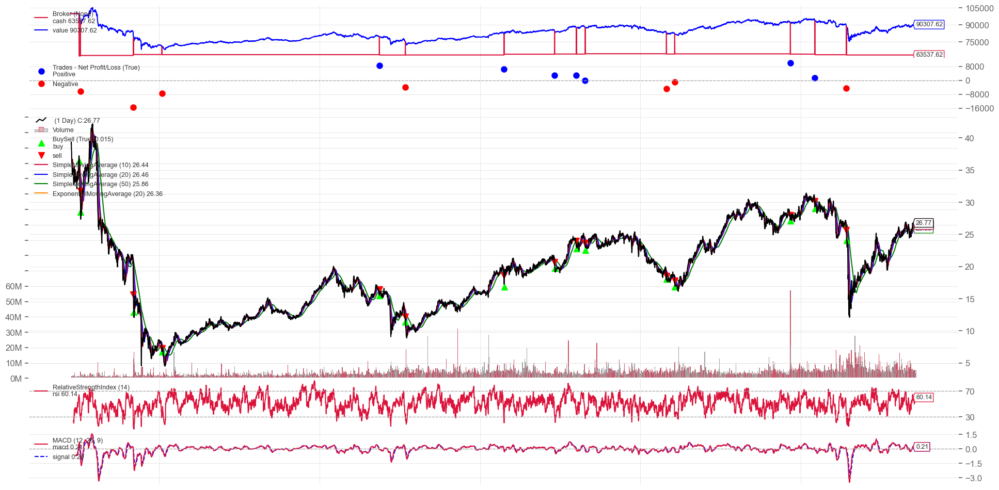

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Total Trades: 14
Winning Trades: 7
Losing Trades: 7
Win Ratio: 0.50
Loss Ratio: 0.50
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $90,307.62
Net Return: -9.69%
Sharpe Ratio: -0.21851118650210927
Max Drawdown: 35.11735360159015%
Max Drawdown Length: 5167


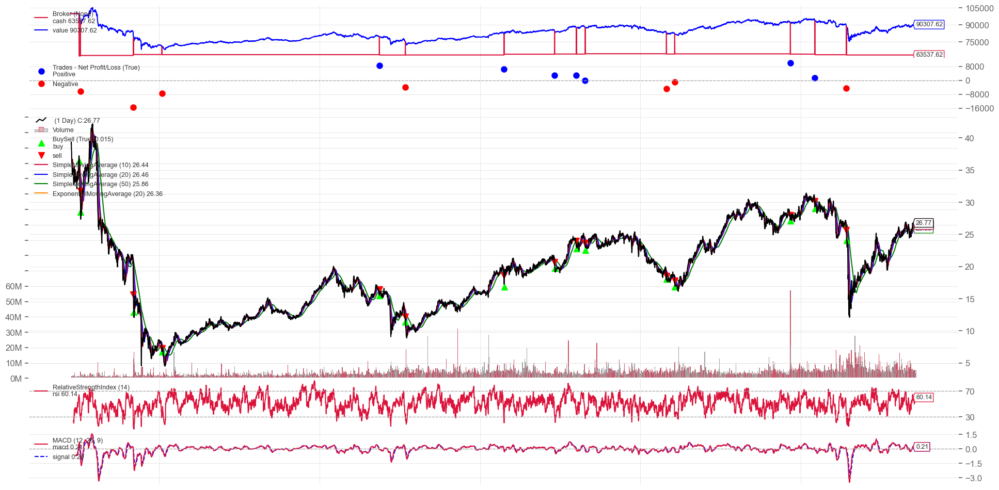

In [76]:

%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 12]
plt.rcParams.update({'font.size': 12})
# Instantiate Cerebro engine
cerebro = bt.Cerebro()

# Create a data feed from the pandas dataframe and add it to Cerebro
data_feed = bt.feeds.PandasData(dataname=best_xgb_df)
cerebro.adddata(data_feed)

# Add the strategy to Cerebro
cerebro.addstrategy(XGBStrategy)

# Set the initial cash
initial_cash = 100000.0
cerebro.broker.setcash(initial_cash)

# Set the commission if any
cerebro.broker.setcommission(commission=0.001)
plt.rcParams['figure.figsize'] = [20, 10]
cerebro.addsizer(bt.sizers.FixedSize, stake=1000)

# Add analyzers for Sharpe Ratio and Drawdown
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe_ratio')
cerebro.addanalyzer(bt.analyzers.DrawDown, _name='draw_down')
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='trade_analyzer')

# Run the strategy
cerebro.run()

# Plot the results
cerebro.plot(iplot=False)
cerebro.plot(savefig=True, figfilename='xgb_chart1.png')

results = cerebro.run()

# Retrieve the analyzers
sharpe_ratio_analyzer = results[0].analyzers.sharpe_ratio.get_analysis()
drawdown_analyzer = results[0].analyzers.draw_down.get_analysis()
trade_analyzer = results[0].analyzers.trade_analyzer.get_analysis()

final_value = cerebro.broker.getvalue()

# Default position size
cerebro.addsizer(bt.sizers.SizerFix, stake=100)
cerebro.addanalyzer(bt.analyzers.PyFolio, _name='PyFolio')
# Run Cerebro Engine
start_portfolio_value = cerebro.broker.getvalue()

results = cerebro.run()
strat = results[0]

portfolio_stats = strat.analyzers.getbyname('PyFolio')
returns, positions, transactions, gross_lev = portfolio_stats.get_pf_items()
returns.index = returns.index.tz_convert(None)
quantstats.reports.html(returns, output='stats2.html', title='XGB Analysis')

# Calculate the net return
net_return = (final_value - initial_cash) / initial_cash * 100
total_trades = trade_analyzer.total.closed
total_winning = trade_analyzer.won.total
total_losing = trade_analyzer.lost.total
win_ratio = total_winning / total_trades if total_trades > 0 else 0
loss_ratio = total_losing / total_trades if total_trades > 0 else 0

print(f'Total Trades: {total_trades}')
print(f'Winning Trades: {total_winning}')
print(f'Losing Trades: {total_losing}')
print(f'Win Ratio: {win_ratio:.2f}')
print(f'Loss Ratio: {loss_ratio:.2f}')
# Print the results
print(f'Initial Portfolio Value: ${initial_cash:,.2f}')
print(f'Final Portfolio Value: ${final_value:,.2f}')
print(f'Net Return: {net_return:.2f}%')

# Print the results
print(f"Sharpe Ratio: {sharpe_ratio_analyzer['sharperatio']}")
print(f"Max Drawdown: {drawdown_analyzer['max']['drawdown']}%")
print(f"Max Drawdown Length: {drawdown_analyzer['max']['len']}")

Support Vector Machine on training dataset and finding the best model

In [63]:

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, precision_score
import joblib

# Define parameter grid for SVM
svm_param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['rbf', 'linear'],
    'gamma': ['scale', 'auto']
    # Add other parameters here
}

# Function to fine-tune and train the SVM model
def fine_tune_and_train_svm(X_train, y_train, ticker):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)

    svm_model = SVC()

    grid_search_svm = GridSearchCV(estimator=svm_model, param_grid=svm_param_grid, cv=3, n_jobs=-1, verbose=2)
    grid_search_svm.fit(X_train_scaled, y_train)

    best_params = grid_search_svm.best_params_
    model = SVC(**best_params)
    model.fit(X_train, y_train)
    
    # Save the scaler and model
    joblib.dump(scaler, f'{ticker}_scaler.pkl')
    joblib.dump(model, f'{ticker}_svm_model.pkl')
    
    return model, scaler

# Training and fine-tuning models
svm_models = {}
for ticker, df in dataframes.items():
    X_train, X_test, y_train, y_test = train_test_split(df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']], df['target'], test_size=0.4, random_state=42)

    model, scaler = fine_tune_and_train_svm(X_train, y_train, ticker)
    X_test_scaled = scaler.transform(X_test)  # Scale the test data
    svm_models[ticker] = {'model': model, 'scaler': scaler, 'X_test': X_test_scaled, 'y_test': y_test}

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits


In [64]:

# Function to evaluate the model
def evaluate_model(model, scaler, X_test, y_test):
    # Scale the test data
    X_test_scaled = scaler.transform(X_test)
    y_pred = model.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    return accuracy, precision

# Evaluate each SVM model
svm_evaluation_results = {}
for ticker, model_data in svm_models.items():
    model = model_data['model']
    scaler = model_data['scaler']
    X_test = model_data['X_test']
    y_test = model_data['y_test']
    accuracy, precision = evaluate_model(model, scaler, X_test, y_test)
    svm_evaluation_results[ticker] = {'accuracy': accuracy, 'precision': precision}

# Find and save the best SVM model
metric_to_use = 'accuracy'  # or 'precision'
best_metric = 0
best_model = None
best_ticker = None
for ticker, metrics in svm_evaluation_results.items():
    if metrics[metric_to_use] > best_metric:
        best_metric = metrics[metric_to_use]
        best_model = svm_models[ticker]['model']
        best_ticker = ticker

if best_model is not None:
    filename = f'best_svm_model_{best_ticker}_{metric_to_use}.joblib'
    joblib.dump(best_model, filename)
    print(f"Saved the best SVM model for {best_ticker} with {metric_to_use}: {best_metric} to {filename}")
else:
    print("No best SVM model found.")


Saved the best SVM model for TSLA with accuracy: 0.5295220243673852 to best_svm_model_TSLA_accuracy.joblib


In [45]:
# Replace with your actual filename
filename = 'best_svm_model_TSLA_accuracy.joblib'  

# Load the model
best_svm = joblib.load(filename)

best_svm_df = dataframes['TSLA']

In [65]:
# Load the scaler and model for demonstration
scaler = joblib.load('CNP_scaler.pkl')
svm_model = joblib.load('CNP_svm_model.pkl')

# Define the Backtrader strategy using the trained XGBoost model
class SVMStrategy(bt.Strategy):
    params = (('model', svm_model), ('scaler', scaler),)
    
    def __init__(self):
        # Define indicators as part of the strategy
        self.sma10 = bt.indicators.SimpleMovingAverage(self.datas[0], period=10)
        self.sma20 = bt.indicators.SimpleMovingAverage(self.datas[0], period=20)
        self.sma50 = bt.indicators.SimpleMovingAverage(self.datas[0], period=50)
        self.ema20 = bt.indicators.ExponentialMovingAverage(self.datas[0], period=20)
        self.rsi = bt.indicators.RelativeStrengthIndex(self.datas[0], period=14)
        self.macd = bt.indicators.MACD(self.datas[0])
        self.signal_line = self.macd.signal

        # To keep track of pending orders
        self.order = None

    def next(self):
        # Skip the first lookback period
        if len(self) < 50:
            return

        # Prepare the features for the current bar in the same way we did for training
        features = np.array([
            (self.datas[0].close[0] - self.sma10[0]) / self.sma10[0],
            (self.datas[0].close[0] - self.sma20[0]) / self.sma20[0],
            (self.datas[0].close[0] - self.sma50[0]) / self.sma50[0],
            (self.datas[0].close[0] - self.ema20[0]) / self.ema20[0],
            self.rsi[0],
            self.macd.macd[0],  # MACD line value
            self.macd.signal[0],  # Signal line value
        ]).reshape(1, -1)  # Reshape for a single sample

        # Scale the features
        features_scaled = self.params.scaler.transform(features)

        # Make the prediction
        prediction = self.params.model.predict(features_scaled)

        # Execute orders based on the prediction
        if prediction > 0.5 and not self.position:
            self.buy()
        elif prediction < 0.5 and self.position:
            self.sell()

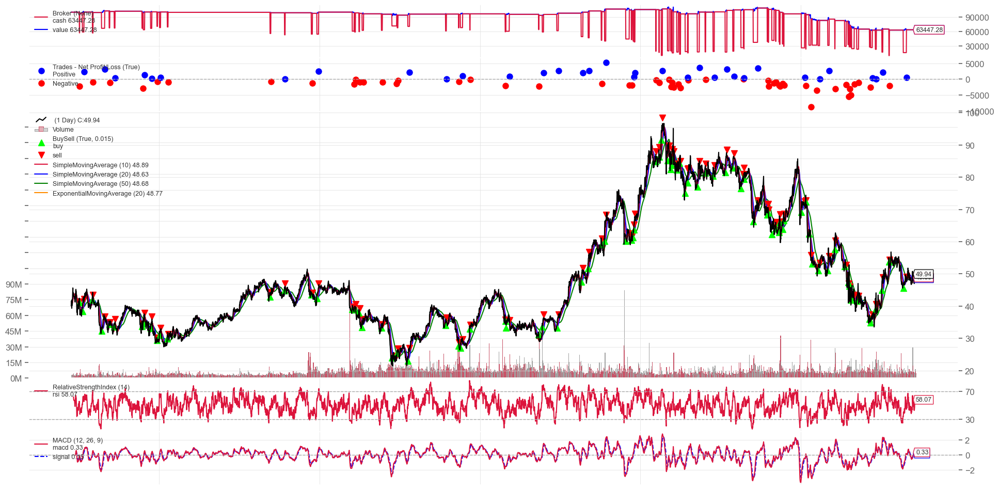

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Total Trades: 87
Winning Trades: 34
Losing Trades: 53
Win Ratio: 0.39
Loss Ratio: 0.61
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $63,447.28
Net Return: -36.55%
Sharpe Ratio: -0.4042626711577262
Max Drawdown: 44.10957420804844%
Max Drawdown Length: 3142


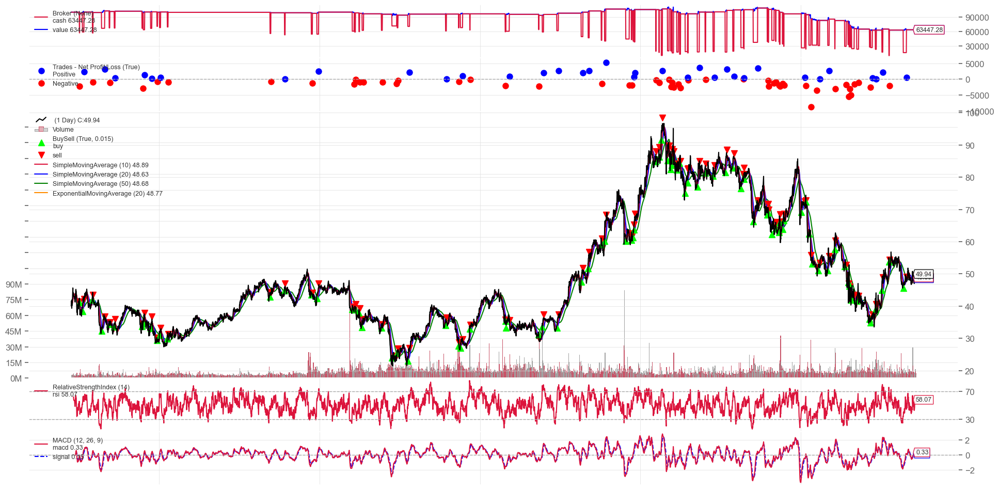

In [75]:

%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 12]
plt.rcParams.update({'font.size': 12})
# Instantiate Cerebro engine
cerebro = bt.Cerebro()

# Create a data feed from the pandas dataframe and add it to Cerebro
data_feed = bt.feeds.PandasData(dataname=best_svm_df)
cerebro.adddata(data_feed)

# Add the strategy to Cerebro
cerebro.addstrategy(SVMStrategy)

# Set the initial cash
initial_cash = 100000.0
cerebro.broker.setcash(initial_cash)

# Set the commission if any
cerebro.broker.setcommission(commission=0.001)
plt.rcParams['figure.figsize'] = [20, 10]
cerebro.addsizer(bt.sizers.FixedSize, stake=1000)

# Add analyzers for Sharpe Ratio and Drawdown
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe_ratio')
cerebro.addanalyzer(bt.analyzers.DrawDown, _name='draw_down')
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='trade_analyzer')

# Run the strategy
cerebro.run()

# Plot the results
cerebro.plot(iplot=False)
cerebro.plot(savefig=True, figfilename='svm_chart1.png')

results = cerebro.run()
# Retrieve the analyzers
sharpe_ratio_analyzer = results[0].analyzers.sharpe_ratio.get_analysis()
drawdown_analyzer = results[0].analyzers.draw_down.get_analysis()
trade_analyzer = results[0].analyzers.trade_analyzer.get_analysis()

final_value = cerebro.broker.getvalue()

# Default position size
cerebro.addsizer(bt.sizers.SizerFix, stake=100)
cerebro.addanalyzer(bt.analyzers.PyFolio, _name='PyFolio')
# Run Cerebro Engine
start_portfolio_value = cerebro.broker.getvalue()

results = cerebro.run()
strat = results[0]

portfolio_stats = strat.analyzers.getbyname('PyFolio')
returns, positions, transactions, gross_lev = portfolio_stats.get_pf_items()
returns.index = returns.index.tz_convert(None)
quantstats.reports.html(returns, output='stats1.html', title='SVM Analysis')


# Calculate the net return
net_return = (final_value - initial_cash) / initial_cash * 100
total_trades = trade_analyzer.total.closed
total_winning = trade_analyzer.won.total
total_losing = trade_analyzer.lost.total
win_ratio = total_winning / total_trades if total_trades > 0 else 0
loss_ratio = total_losing / total_trades if total_trades > 0 else 0

print(f'Total Trades: {total_trades}')
print(f'Winning Trades: {total_winning}')
print(f'Losing Trades: {total_losing}')
print(f'Win Ratio: {win_ratio:.2f}')
print(f'Loss Ratio: {loss_ratio:.2f}')
# Print the results
print(f'Initial Portfolio Value: ${initial_cash:,.2f}')
print(f'Final Portfolio Value: ${final_value:,.2f}')
print(f'Net Return: {net_return:.2f}%')

# Print the results
print(f"Sharpe Ratio: {sharpe_ratio_analyzer['sharperatio']}")
print(f"Max Drawdown: {drawdown_analyzer['max']['drawdown']}%")
print(f"Max Drawdown Length: {drawdown_analyzer['max']['len']}")


### THIS IS AS I HAVE GOTTEN from 11:55pm
### the following is still in progress


### Task 8

SVM - out of sample data

In [82]:
data_dir = 'stock_dfs/'
stock_data = {}

for file_name in os.listdir(data_dir):
    if file_name.endswith('.csv'):
        ticker = file_name.split('.')[0]
        # df = pd.read_csv(os.path.join(data_dir, file_name))
        print(os.path.join(data_dir, file_name))
        stock_data[ticker] = preprocess_data(os.path.join(data_dir, file_name), 'bfill', 'standard')

def add_features(df):
    df['daily_return'] = df['close'].pct_change() * 100
    for window in [10, 20, 50, 200]:
        df[f'moving_avg_{window}'] = df['close'].rolling(window=window).mean()
    df['ema_20'] = df['close'].ewm(span=20, adjust=False).mean()
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['rsi_14'] = 100 - (100 / (1 + rs))
    exp1 = df['close'].ewm(span=12, adjust=False).mean()
    exp2 = df['close'].ewm(span=26, adjust=False).mean()
    df['macd'] = exp1 - exp2
    df['signal_line'] = df['macd'].ewm(span=9, adjust=False).mean()
    df['target'] = (df['daily_return'] > 0).astype(int)

    df.dropna(inplace=True)
    return df

def preprocess_data(data, fill_method='ffill', scaler_type='standard'):
    # Filling missing values
    if fill_method == 'ffill':
        data.fillna(method='ffill', inplace=True)  # Forward fill
    elif fill_method == 'bfill':
        data.fillna(method='bfill', inplace=True)  # Backward fill
    else:
        raise ValueError("fill_method must be 'ffill' or 'bfill'")
    
    # Removing outliers - simple method by excluding any data beyond 3 standard deviations
    data = data[(np.abs(stats.zscore(data.select_dtypes(include=[np.number]))) < 3).all(axis=1)]
    
    # Normalizing data
    if scaler_type == 'standard':
        scaler = StandardScaler()
    elif scaler_type == 'minmax':
        scaler = MinMaxScaler()
    else:
        raise ValueError("scaler_type must be 'standard' or 'minmax'")
    
    numeric_columns = data.select_dtypes(include=[np.number]).columns
    data[numeric_columns] = scaler.fit_transform(data[numeric_columns])
    
    return data


for ticker, df in stock_data.items():
    stock_data[ticker] = preprocess_data(df, fill_method='bfill', scaler_type='standard')
    stock_data[ticker] = add_features(df)


stock_dfs/DAL.csv
stock_dfs/DE.csv
stock_dfs/DFS.csv
stock_dfs/DG.csv
stock_dfs/DGX.csv
stock_dfs/DHI.csv
stock_dfs/DHR.csv
stock_dfs/DIS.csv
stock_dfs/DISCA.csv
stock_dfs/DISCK.csv
stock_dfs/DISH.csv
stock_dfs/DLR.csv
stock_dfs/DLTR.csv
stock_dfs/DOV.csv
stock_dfs/DRE.csv
stock_dfs/DRI.csv
stock_dfs/DTE.csv
stock_dfs/DUK.csv
stock_dfs/DVA.csv
stock_dfs/DVN.csv
stock_dfs/DWDP.csv
stock_dfs/DXC.csv
stock_dfs/EA.csv
stock_dfs/EBAY.csv
stock_dfs/ECL.csv
stock_dfs/ED.csv
stock_dfs/EFX.csv
stock_dfs/EIX.csv
stock_dfs/EL.csv
stock_dfs/EMN.csv
stock_dfs/EMR.csv
stock_dfs/EOG.csv
stock_dfs/EQIX.csv
stock_dfs/EQR.csv
stock_dfs/EQT.csv
stock_dfs/ES.csv
stock_dfs/ESRX.csv
stock_dfs/ESS.csv
stock_dfs/ETFC.csv
stock_dfs/ETN.csv
stock_dfs/ETR.csv
stock_dfs/EVRG.csv
stock_dfs/EW.csv
stock_dfs/EXC.csv
stock_dfs/EXPD.csv
stock_dfs/EXPE.csv
stock_dfs/EXR.csv
stock_dfs/F.csv
stock_dfs/FAST.csv
stock_dfs/FB.csv
stock_dfs/FBHS.csv
stock_dfs/FCX.csv
stock_dfs/FDX.csv
stock_dfs/FE.csv
stock_dfs/FFIV.csv
stoc

In [83]:
#Xtreme Gradient Boosting
filename = 'best_model_CNP_accuracy.joblib'  # Replace with your filename
best_xgb_model = joblib.load(filename)

In [85]:
from sklearn.metrics import accuracy_score, precision_score

from sklearn.metrics import accuracy_score, precision_score

evaluation_results = {}
for ticker, df in stock_data.items():
    # Check if 'target' has any missing values or unexpected labels
    if df['target'].isnull().any() or set(df['target'].unique()) != {0, 1}:
        print(f"Skipping {ticker} due to target variable issues.")
        continue

    # Assuming the features used for the model training are as follows
    features = ['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']

    # Separate features and target
    X = df[features]
    y = df['target']

    # If your model requires scaled data, scale X as per the scaler used during training

    # Make predictions
    y_pred = best_xgb_model.predict(X)

    # Evaluate accuracy and precision
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred)

    # Store the results
    evaluation_results[ticker] = {'accuracy': accuracy, 'precision': precision}



Skipping EVRG due to target variable issues.
Skipping LIN due to target variable issues.


In [86]:
display(evaluation_results)

{'DAL': {'accuracy': 0.4833110814419226, 'precision': 0.48010973936899864},
 'DE': {'accuracy': 0.52, 'precision': 0.5168236877523553},
 'DFS': {'accuracy': 0.5079787234042553, 'precision': 0.5074224021592443},
 'DG': {'accuracy': 0.5188172043010753, 'precision': 0.5151098901098901},
 'DGX': {'accuracy': 0.5039787798408488, 'precision': 0.5033288948069241},
 'DHI': {'accuracy': 0.4979973297730307, 'precision': 0.5006784260515604},
 'DHR': {'accuracy': 0.49525101763907736, 'precision': 0.49519890260631},
 'DIS': {'accuracy': 0.48590604026845635, 'precision': 0.4855570839064649},
 'DISCA': {'accuracy': 0.4786096256684492, 'precision': 0.4718792866941015},
 'DISCK': {'accuracy': 0.4785522788203753, 'precision': 0.4731034482758621},
 'DISH': {'accuracy': 0.5099337748344371, 'precision': 0.5093333333333333},
 'DLR': {'accuracy': 0.49867724867724866, 'precision': 0.499330655957162},
 'DLTR': {'accuracy': 0.47289972899729, 'precision': 0.4724517906336088},
 'DOV': {'accuracy': 0.5173796791443

In [ ]:
predictions = best_model.predict(new_df_prepared)  # Use new_df_scaled if you applied scaling


In [352]:
sharpe_ratios = {} 
draw_down_ratios = {}
return_best = {}

for ticker, df in stock_data.items():
    print(ticker)
    def evaluate_model_performance(y_true, y_pred):
        accuracy = accuracy_score(y_true, y_pred)
        precision = precision_score(y_true, y_pred)
        return accuracy, precision

    def evaluate_performance(y_test, predictions, model_name):
        # Calculate accuracy and precision
        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        # Calculate the ROC curve and AUC
        fpr, tpr, _ = roc_curve(y_test, predictions)
        roc_auc = auc(fpr, tpr)
        

    df['date'] = pd.to_datetime(df['date'])
    # Set 'Date' as the index of the DataFrame
    df.set_index('date', inplace=True)
    # stock_data['EBAY']
    df.sort_index(inplace=True)
    # Create a binary classification target: 1 if the price will rise the next day, 0 otherwise
    df['target'] = (df['daily_return'] > 0).astype(int)
    # Select features and the target
    X = df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']]
    y = df['target']
    # Split the data into a training set and a testing set
    
    
    X_train, X_test, y_train, y_test

    min_samples_for_split = 42  # You can adjust this threshold as needed

    if len(X) >= min_samples_for_split:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
    else:
        # Handle the case where there's not enough data
        # You might choose to skip this dataset or adjust the test size
        print(f"Not enough data for ticker {ticker}. Only {len(X)} samples available.")
        continue  # Skip to the next iteration of the loop

    # Standardize the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    # Train an SVM model
    svm_model = svm.SVC()
    svm_model.fit(X_train_scaled, y_train)
    # Make predictions with the SVM model
    svm_predictions = svm_model.predict(X_test_scaled)
    # Evaluate the SVM model
    svm_accuracy = accuracy_score(y_test, svm_predictions)
    svm_class_report = classification_report(y_test, svm_predictions)
    # Assuming y_test and predictions are already defined
    svm_precision = precision_score(y_test, svm_predictions)
    # print(f"SVM Accuracy: {svm_accuracy:.4f}, SVM Precision: {svm_precision:.4f}")
    # Evaluate SVM performance
    evaluate_performance(y_test, svm_predictions, 'SVM')
    # Here we prepare the features (X) and the target (y) for model training
    X = df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']].values
    y = (df['daily_return'] > 0).astype(int).values  # Target: 1 if return > 0, else 0
  
  
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    # Train the SVM model
    svm_model = svm.SVC()
    svm_model.fit(X_train_scaled, y_train)
    # Save the scaler and model (do this in your local environment)
    joblib.dump(scaler, 'a_scaler.pkl')
    joblib.dump(svm_model, 'a_model.pkl')
    # Load the scaler and model (for demonstration; in practice, use the saved files)
    scaler = joblib.load('a_scaler.pkl')
    svm_model = joblib.load('a_model.pkl')
    # Define the Backtrader strategy using the trained SVM model
    class svm_a(bt.Strategy):
        params = (('model', svm_model), ('scaler', scaler),)
        
        def __init__(self):
            # Define indicators as part of the strategy
            self.sma10 = bt.indicators.SimpleMovingAverage(self.datas[0], period=10)
            self.sma20 = bt.indicators.SimpleMovingAverage(self.datas[0], period=20)
            self.sma50 = bt.indicators.SimpleMovingAverage(self.datas[0], period=50)
            self.ema20 = bt.indicators.ExponentialMovingAverage(self.datas[0], period=20)
            self.rsi = bt.indicators.RelativeStrengthIndex(self.datas[0], period=14)
            self.macd = bt.indicators.MACD(self.datas[0])
            self.signal_line = self.macd.signal

            # To keep track of pending orders
            self.order = None

        def next(self):
            # Skip the first lookback period
            if len(self) < 50:
                return

            # Prepare the features for the current bar in the same way we did for training
            features = np.array([
                (self.datas[0].close[0] - self.sma10[0]) / self.sma10[0],
                (self.datas[0].close[0] - self.sma20[0]) / self.sma20[0],
                (self.datas[0].close[0] - self.sma50[0]) / self.sma50[0],
                (self.datas[0].close[0] - self.ema20[0]) / self.ema20[0],
                self.rsi[0],
                self.macd.macd[0],  # MACD line value
                self.macd.signal[0],  # Signal line value
            ]).reshape(1, -1)  # Reshape for a single sample

            # Scale the features
            features_scaled = self.params.scaler.transform(features)

            # Make the prediction
            prediction = self.params.model.predict(features_scaled)

            # Execute orders based on the prediction
            if prediction > 0.5 and not self.position:
                self.buy()
            elif prediction < 0.5 and self.position:
                self.sell()



    # Instantiate Cerebro engine
    cerebro = bt.Cerebro()
    # Create a data feed from the pandas dataframe and add it to Cerebro
    data_feed = bt.feeds.PandasData(dataname=df)
    cerebro.adddata(data_feed)
    # Add the strategy to Cerebro
    cerebro.addstrategy(svm_a)
    # Set the initial cash
    initial_cash = 100000.0
    cerebro.broker.setcash(initial_cash)
    # Set the commission if any
    cerebro.broker.setcommission(commission=0.001)
    plt.rcParams['figure.figsize'] = [20, 10]
    cerebro.addsizer(bt.sizers.FixedSize, stake=1000)
    # Add analyzers for Sharpe Ratio and Drawdown
    cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe_ratio')
    cerebro.addanalyzer(bt.analyzers.DrawDown, _name='draw_down')
    # Run the strategy
    cerebro.run()
    # cerebro.plot()
    results = cerebro.run()
    # Retrieve the analyzers
    sharpe_ratio_analyzer = results[0].analyzers.sharpe_ratio.get_analysis()
    drawdown_analyzer = results[0].analyzers.draw_down.get_analysis()
    final_value = cerebro.broker.getvalue()
    # Calculate the net return
    net_return = (final_value - initial_cash) / initial_cash * 100



    # Store the Sharpe Ratio in the dictionary
    sharpe_ratios[ticker] = sharpe_ratio_analyzer['sharperatio']
    draw_down_ratios[ticker] = drawdown_analyzer['max']['drawdown']
    return_best[ticker] = net_return

DAL
DE
DFS
DG
DGX
DHI
DHR
DIS
DISCA
DISCK
DISH
DLR
DLTR
DOV
DRE
DRI
DTE
DUK
DVA
DVN
DWDP
DXC
EA
EBAY
ECL
ED
EFX
EIX
EL
EMN
EMR
EOG
EQIX
EQR
EQT
ES
ESRX
ESS
ETFC
ETN
ETR
EVRG
Not enough data for ticker EVRG. Only 0 samples available.
EW
EXC
EXPD
EXPE
EXR
F
FAST
FB
FBHS
FCX
FDX
FE
FFIV
FIS
FISV
FITB
FL
FLIR
FLR
FLS
FLT
FMC
FOX
FOXA
FRT
FTI
FTNT
FTV
GD
GE
GILD
GIS
GLW
GM
GOOG
GOOGL
GPC
GPN
GPS
GRMN
GS
GT
GWW
HAL
HAS
HBAN
HBI
HCA
HCP
HD
HES
HFC
HIG
HII
HLT
HOG
HOLX
HON
HP
HPE
HPQ
HRB
HRL
HRS
HSIC
HST
HSY
HUM
IBM
ICE
IDXX
IFF
ILMN
INCY
INFO
INTC
INTU
IP
IPG
IPGP
IQV
IR
IRM
ISRG
IT
ITW
IVZ
JBHT
JCI
JEC
JEF
JNJ
JNPR
JPM
JWN
K
KEY
KHC
KIM
KLAC
KMB
KMI
KMX
KO
KORS
KR
KSS
KSU
L
LB
LEG
LEN
LH
LIN
Not enough data for ticker LIN. Only 0 samples available.
LKQ
LLL
LLY
LMT
LNC
LNT
LOW
LRCX
LUV
LYB
M
MA
MAA
MAC
MAR
MAS
MAT
MCD
MCHP
MCK
MCO
MDLZ
MDT
MET
MGM
MHK
MKC
MLM
MMC
MMM
MNST
MO
MOS
MPC
MRK
MRO
MS
MSCI
MSFT
MSI
MTB
MTD
MU
MYL
NBL
NCLH
NDAQ
NEE
NEM
NFLX
NFX
NI
NKE
NKTR
NLSN
NOC
NOV
NRG
NSC
NTAP
NT

In [353]:
# Filter out entries where Sharpe Ratio is None
filtered_sharpe_ratios = {ticker: ratio for ticker, ratio in sharpe_ratios.items() if ratio is not None}

# Sort the filtered dictionary by Sharpe Ratio values in descending order
sorted_sharpe_ratios = sorted(filtered_sharpe_ratios.items(), key=lambda x: x[1], reverse=True)

# Get the top 10 stocks with the highest Sharpe Ratios
top_10_sharpe_ratios = sorted_sharpe_ratios[:10]

# Print the top 10 stocks with their Sharpe Ratios
print("Top 10 Stocks by Sharpe Ratio:")
for ticker, sharpe_ratio in top_10_sharpe_ratios:
    print(f"Ticker: {ticker}, Sharpe Ratio: {sharpe_ratio}")

Top 10 Stocks by Sharpe Ratio:
Ticker: SYF, Sharpe Ratio: 0.2041691287526498
Ticker: HSY, Sharpe Ratio: 0.009250157970300545
Ticker: ORCL, Sharpe Ratio: -0.06709399721612418
Ticker: ILMN, Sharpe Ratio: -0.1028269086941033
Ticker: PX, Sharpe Ratio: -0.17024492465525812
Ticker: GM, Sharpe Ratio: -0.17743098680666766
Ticker: PG, Sharpe Ratio: -0.19477687720277076
Ticker: UAL, Sharpe Ratio: -0.2089494859093226
Ticker: VFC, Sharpe Ratio: -0.21358750998461273
Ticker: VZ, Sharpe Ratio: -0.2855441966175649


In [354]:
# Filter out entries where Sharpe Ratio is None
filtered_draw_down_ratios = {ticker: ratio for ticker, ratio in draw_down_ratios.items() if ratio is not None}

# Sort the filtered dictionary by Sharpe Ratio values in descending order
sorted_draw_down_ratios = sorted(filtered_draw_down_ratios.items(), key=lambda x: x[1], reverse=True)

# Get the top 10 stocks with the highest Sharpe Ratios
top_10_sdraw_down_ratios = sorted_draw_down_ratios[:10]

# Print the top 10 stocks with their Sharpe Ratios
print("Top 10 Stocks by Drawdown:")
for ticker, r in top_10_sdraw_down_ratios:
    print(f"Ticker: {ticker}, Drawdown: {r}")


Top 10 Stocks by Drawdown:
Ticker: UHS, Drawdown: 6.506938820833079
Ticker: F, Drawdown: 6.20161359117406
Ticker: PSA, Drawdown: 5.537210135763775
Ticker: SBUX, Drawdown: 5.3708881968896485
Ticker: OMC, Drawdown: 4.679513882816147
Ticker: FL, Drawdown: 4.661836753518724
Ticker: NLSN, Drawdown: 4.659732765558306
Ticker: IPG, Drawdown: 4.6516896486503265
Ticker: PPL, Drawdown: 4.60958215006288
Ticker: WHR, Drawdown: 4.542365759624178


In [355]:
# Filter out entries where Sharpe Ratio is None
filtered_return_best = {ticker: ratio for ticker, ratio in return_best.items() if ratio is not None}

# Sort the filtered dictionary by Sharpe Ratio values in descending order
sorted_return_best = sorted(filtered_return_best.items(), key=lambda x: x[1], reverse=True)

# Get the top 10 stocks with the highest Sharpe Ratios
top_10_return_best = sorted_return_best[:10]

# Print the top 10 stocks with their Sharpe Ratios
print("Top 10 Stocks by Return:")
for ticker, r in top_10_return_best:
    print(f"Ticker: {ticker}, Return: {r}")


Top 10 Stocks by Return:
Ticker: SYF, Return: 4.669497474842864
Ticker: HSY, Return: 4.078000209588849
Ticker: ORCL, Return: 3.8214005827659423
Ticker: ILMN, Return: 3.7418395602221133
Ticker: PX, Return: 3.59763907474195
Ticker: PG, Return: 3.559934202754826
Ticker: VFC, Return: 3.351509103740522
Ticker: GM, Return: 3.168684369541108
Ticker: PCAR, Return: 3.0821142019271646
Ticker: FFIV, Return: 3.081446611095118


XGBoost - Out of Sample Data

In [319]:

data_dir = './stocks/'
stock_data = {}

for file_name in os.listdir(data_dir):
    if file_name.endswith('.csv'):
        ticker = file_name.split('.')[0]
        # df = pd.read_csv(os.path.join(data_dir, file_name))
        print(os.path.join(data_dir, file_name))
        stock_data[ticker] = preprocess_data(os.path.join(data_dir, file_name), 'bfill', 'standard')

def add_features(df):
    df['daily_return'] = df['close'].pct_change() * 100
    for window in [10, 20, 50, 200]:
        df[f'moving_avg_{window}'] = df['close'].rolling(window=window).mean()
    df['ema_20'] = df['close'].ewm(span=20, adjust=False).mean()
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['rsi_14'] = 100 - (100 / (1 + rs))
    exp1 = df['close'].ewm(span=12, adjust=False).mean()
    exp2 = df['close'].ewm(span=26, adjust=False).mean()
    df['macd'] = exp1 - exp2
    df['signal_line'] = df['macd'].ewm(span=9, adjust=False).mean()
    df.dropna(inplace=True)
    return df

for ticker, df in stock_data.items():
    stock_data[ticker] = add_features(df)


./stocks/DAL.csv
./stocks/DE.csv
./stocks/DFS.csv
./stocks/DG.csv
./stocks/DGX.csv
./stocks/DHI.csv
./stocks/DHR.csv
./stocks/DIS.csv
./stocks/DISCA.csv
./stocks/DISCK.csv
./stocks/DISH.csv
./stocks/DLR.csv
./stocks/DLTR.csv
./stocks/DOV.csv
./stocks/DRE.csv
./stocks/DRI.csv
./stocks/DTE.csv
./stocks/DUK.csv
./stocks/DVA.csv
./stocks/DVN.csv
./stocks/DWDP.csv
./stocks/DXC.csv
./stocks/EA.csv
./stocks/EBAY.csv
./stocks/ECL.csv
./stocks/ED.csv
./stocks/EFX.csv
./stocks/EIX.csv
./stocks/EL.csv
./stocks/EMN.csv
./stocks/EMR.csv
./stocks/EOG.csv
./stocks/EQIX.csv
./stocks/EQR.csv
./stocks/EQT.csv
./stocks/ES.csv
./stocks/ESRX.csv
./stocks/ESS.csv
./stocks/ETFC.csv
./stocks/ETN.csv
./stocks/ETR.csv
./stocks/EVRG.csv
./stocks/EW.csv
./stocks/EXC.csv
./stocks/EXPD.csv
./stocks/EXPE.csv
./stocks/EXR.csv
./stocks/F.csv
./stocks/FAST.csv
./stocks/FB.csv
./stocks/FBHS.csv
./stocks/FCX.csv
./stocks/FDX.csv
./stocks/FE.csv
./stocks/FFIV.csv
./stocks/FIS.csv
./stocks/FISV.csv
./stocks/FITB.csv
./stoc

In [307]:

sharpe_ratios = {} 
draw_down_ratios = {}
return_best = {}

for ticker, df in stock_data.items():
    print(ticker)
    def evaluate_model_performance(y_true, y_pred):
        accuracy = accuracy_score(y_true, y_pred)
        precision = precision_score(y_true, y_pred)
        return accuracy, precision

    def evaluate_performance(y_test, predictions, model_name):
        # Calculate accuracy and precision
        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        # Calculate the ROC curve and AUC
        fpr, tpr, _ = roc_curve(y_test, predictions)
        roc_auc = auc(fpr, tpr)
    

    df['date'] = pd.to_datetime(df['date'])
    # Set 'Date' as the index of the DataFrame
    df.set_index('date', inplace=True)
    # stock_data['EBAY']
    df.sort_index(inplace=True)
    # Create a binary classification target: 1 if the price will rise the next day, 0 otherwise
    df['target'] = (df['daily_return'] > 0).astype(int)
    # Select features and the target
    X = df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']]
    y = df['target']
    # Split the data into a training set and a testing set
    
    
    X_train, X_test, y_train, y_test

    min_samples_for_split = 42  # You can adjust this threshold as needed

    if len(X) >= min_samples_for_split:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
    else:
        # Handle the case where there's not enough data
        # You might choose to skip this dataset or adjust the test size
        print(f"Not enough data for ticker {ticker}. Only {len(X)} samples available.")
        continue  # Skip to the next iteration of the loop

    # Standardize the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
 
    xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
    xgb_model.fit(X_train_scaled, y_train)




    # Make predictions with the XGBoost model
    xgb_predictions = xgb_model.predict(X_test_scaled)

# Evaluate the XGBoost model
    xgb_accuracy = accuracy_score(y_test, xgb_predictions)
    xgb_class_report = classification_report(y_test, xgb_predictions)



    # Assuming y_test and predictions are already defined

    xgb_precision = precision_score(y_test, xgb_predictions)

    # Evaluate SVM performance
    evaluate_performance(y_test, xgb_predictions, 'XGB')
    # Here we prepare the features (X) and the target (y) for model training
    X = df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']].values
    y = (df['daily_return'] > 0).astype(int).values  # Target: 1 if return > 0, else 0

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
    xgb_model.fit(X_train_scaled, y_train)





    # Save the scaler and model (do this in your local environment)
    joblib.dump(scaler, 'a_scaler.pkl')
    joblib.dump(xgb_model, 'a_model.pkl')
    # Load the scaler and model (for demonstration; in practice, use the saved files)
    scaler = joblib.load('a_scaler.pkl')
    xgb_model = joblib.load('a_model.pkl')
    # Define the Backtrader strategy using the trained SVM model
    class xgb_a(bt.Strategy):
        params = (('model', xgb_model), ('scaler', scaler),)
        
        def __init__(self):
            # Define indicators as part of the strategy
            self.sma10 = bt.indicators.SimpleMovingAverage(self.datas[0], period=10)
            self.sma20 = bt.indicators.SimpleMovingAverage(self.datas[0], period=20)
            self.sma50 = bt.indicators.SimpleMovingAverage(self.datas[0], period=50)
            self.ema20 = bt.indicators.ExponentialMovingAverage(self.datas[0], period=20)
            self.rsi = bt.indicators.RelativeStrengthIndex(self.datas[0], period=14)
            self.macd = bt.indicators.MACD(self.datas[0])
            self.signal_line = self.macd.signal

            # To keep track of pending orders
            self.order = None

        def next(self):
            # Skip the first lookback period
            if len(self) < 50:
                return

            # Prepare the features for the current bar in the same way we did for training
            features = np.array([
                (self.datas[0].close[0] - self.sma10[0]) / self.sma10[0],
                (self.datas[0].close[0] - self.sma20[0]) / self.sma20[0],
                (self.datas[0].close[0] - self.sma50[0]) / self.sma50[0],
                (self.datas[0].close[0] - self.ema20[0]) / self.ema20[0],
                self.rsi[0],
                self.macd.macd[0],  # MACD line value
                self.macd.signal[0],  # Signal line value
            ]).reshape(1, -1)  # Reshape for a single sample

            # Scale the features
            features_scaled = self.params.scaler.transform(features)

            # Make the prediction
            prediction = self.params.model.predict(features_scaled)

            # Execute orders based on the prediction
            if prediction > 0.5 and not self.position:
                self.buy()
            elif prediction < 0.5 and self.position:
                self.sell()



    # Instantiate Cerebro engine
    cerebro = bt.Cerebro()
    # Create a data feed from the pandas dataframe and add it to Cerebro
    data_feed = bt.feeds.PandasData(dataname=df)
    cerebro.adddata(data_feed)
    # Add the strategy to Cerebro
    cerebro.addstrategy(xgb_a)
    # Set the initial cash
    initial_cash = 100000.0
    cerebro.broker.setcash(initial_cash)
    # Set the commission if any
    cerebro.broker.setcommission(commission=0.001)
    plt.rcParams['figure.figsize'] = [20, 10]
    cerebro.addsizer(bt.sizers.FixedSize, stake=1000)
    # Add analyzers for Sharpe Ratio and Drawdown
    cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe_ratio')
    cerebro.addanalyzer(bt.analyzers.DrawDown, _name='draw_down')
    # Run the strategy
    cerebro.run()
    # cerebro.plot()
    results = cerebro.run()
    # Retrieve the analyzers
    sharpe_ratio_analyzer = results[0].analyzers.sharpe_ratio.get_analysis()
    drawdown_analyzer = results[0].analyzers.draw_down.get_analysis()
    final_value = cerebro.broker.getvalue()
    # Calculate the net return
    net_return = (final_value - initial_cash) / initial_cash * 100



    # Store the Sharpe Ratio in the dictionary
    sharpe_ratios[ticker] = sharpe_ratio_analyzer['sharperatio']
    draw_down_ratios[ticker] = drawdown_analyzer['max']['drawdown']
    return_best[ticker] = net_return
    

DAL
DE
DFS
DG
DGX
DHI
DHR
DIS
DISCA
DISCK
DISH
DLR
DLTR
DOV
DRE
DRI
DTE
DUK
DVA
DVN
DWDP
DXC
EA
EBAY
ECL
ED
EFX
EIX
EL
EMN
EMR
EOG
EQIX
EQR
EQT
ES
ESRX
ESS
ETFC
ETN
ETR
EVRG
Not enough data for ticker EVRG. Only 0 samples available.
EW
EXC
EXPD
EXPE
EXR
F
FAST
FB
FBHS
FCX
FDX
FE
FFIV
FIS
FISV
FITB
FL
FLIR
FLR
FLS
FLT
FMC
FOX
FOXA
FRT
FTI
FTNT
FTV
GD
GE
GILD
GIS
GLW
GM
GOOG
GOOGL
GPC
GPN
GPS
GRMN
GS
GT
GWW
HAL
HAS
HBAN
HBI
HCA
HCP
HD
HES
HFC
HIG
HII
HLT
HOG
HOLX
HON
HP
HPE
HPQ
HRB
HRL
HRS
HSIC
HST
HSY
HUM
IBM
ICE
IDXX
IFF
ILMN
INCY
INFO
INTC
INTU
IP
IPG
IPGP
IQV
IR
IRM
ISRG
IT
ITW
IVZ
JBHT
JCI
JEC
JEF
JNJ
JNPR
JPM
JWN
K
KEY
KHC
KIM
KLAC
KMB
KMI
KMX
KO
KORS
KR
KSS
KSU
L
LB
LEG
LEN
LH
LIN
Not enough data for ticker LIN. Only 0 samples available.
LKQ
LLL
LLY
LMT
LNC
LNT
LOW
LRCX
LUV
LYB
M
MA
MAA
MAC
MAR
MAS
MAT
MCD
MCHP
MCK
MCO
MDLZ
MDT
MET
MGM
MHK
MKC
MLM
MMC
MMM
MNST
MO
MOS
MPC
MRK
MRO
MS
MSCI
MSFT
MSI
MTB
MTD
MU
MYL
NBL
NCLH
NDAQ
NEE
NEM
NFLX
NFX
NI
NKE
NKTR
NLSN
NOC
NOV
NRG
NSC
NTAP
NT

In [312]:
# Filter out entries where Sharpe Ratio is None
filtered_sharpe_ratios = {ticker: ratio for ticker, ratio in draw_down_ratios.items() if ratio is not None}

# Sort the filtered dictionary by Sharpe Ratio values in descending order
sorted_draw_down_ratios = sorted(filtered_draw_down_ratios.items(), key=lambda x: x[1], reverse=True)

# Get the top 10 stocks with the highest Sharpe Ratios
top_10_draw_down_ratios = sorted_draw_down_ratios[:10]

# Print the top 10 stocks with their Sharpe Ratios
print("Top 10 Stocks by Sharpe Ratio:")
for ticker, r in top_10_sharpe_ratios:
    print(f"Ticker: {ticker}, Sharpe Ratio: {r}")


Top 10 Stocks by Sharpe Ratio:
Ticker: SYF, Sharpe Ratio: 0.2041691287526498
Ticker: HSY, Sharpe Ratio: 0.009250157970300545
Ticker: ORCL, Sharpe Ratio: -0.06709399721612418
Ticker: ILMN, Sharpe Ratio: -0.1028269086941033
Ticker: PX, Sharpe Ratio: -0.17024492465525812
Ticker: GM, Sharpe Ratio: -0.17743098680666766
Ticker: PG, Sharpe Ratio: -0.19477687720277076
Ticker: UAL, Sharpe Ratio: -0.2089494859093226
Ticker: VFC, Sharpe Ratio: -0.21358750998461273
Ticker: VZ, Sharpe Ratio: -0.2855441966175649


In [317]:
# Filter out entries where Sharpe Ratio is None
filtered_draw_down_ratios = {ticker: ratio for ticker, ratio in draw_down_ratios.items() if ratio is not None}

# Sort the filtered dictionary by Sharpe Ratio values in descending order
sorted_draw_down_ratios = sorted(filtered_draw_down_ratios.items(), key=lambda x: x[1], reverse=True)

# Get the top 10 stocks with the highest Sharpe Ratios
top_10_draw_down_ratios = sorted_draw_down_ratios[:10]

# Print the top 10 stocks with their Sharpe Ratios
print("Top 10 Stocks by Drawdown:")
for ticker, r in top_10_draw_down_ratios:
    print(f"Ticker: {ticker}, Drawdown: {r}")


Top 10 Stocks by Drawdown:
Ticker: F, Drawdown: 7.359041567921231
Ticker: GIS, Drawdown: 6.745107134149751
Ticker: UHS, Drawdown: 6.203596341614025
Ticker: FLR, Drawdown: 6.0440781108467245
Ticker: KMB, Drawdown: 5.7317495508651835
Ticker: PPL, Drawdown: 5.3659087259286045
Ticker: JCI, Drawdown: 5.142036554625962
Ticker: IPG, Drawdown: 5.080391033550669
Ticker: NCLH, Drawdown: 4.883352833792058
Ticker: JNPR, Drawdown: 4.686316214731459


In [315]:
# Filter out entries where Sharpe Ratio is None
filtered_return_best = {ticker: ratio for ticker, ratio in return_best.items() if ratio is not None}

# Sort the filtered dictionary by Sharpe Ratio values in descending order
sorted_return_best = sorted(filtered_return_best.items(), key=lambda x: x[1], reverse=True)

# Get the top 10 stocks with the highest Sharpe Ratios
top_10_return_best = sorted_return_best[:10]

# Print the top 10 stocks with their Sharpe Ratios
print("Top 10 Stocks by Return:")
for ticker, r in top_10_return_best:
    print(f"Ticker: {ticker}, Return: {r}")


Top 10 Stocks by Return:
Ticker: VRSK, Return: 4.037831019201097
Ticker: PCAR, Return: 3.91076690941547
Ticker: VAR, Return: 3.7050486636569984
Ticker: ORCL, Return: 3.5906072652539733
Ticker: SRE, Return: 3.541528429680795
Ticker: PVH, Return: 3.501127624367247
Ticker: IQV, Return: 3.2383115369301523
Ticker: UTX, Return: 3.1237670535085487
Ticker: EXC, Return: 2.946831358975949
Ticker: HIG, Return: 2.794056532469025


XGB - TOP 10

In [328]:

# from your_preprocessing_module import preprocess_data  # Assuming you have a function to preprocess data

data_dir = './stocks/'
stock_data = {}

for file_name in os.listdir(data_dir):
    if file_name.endswith('.csv'):
        ticker = file_name.split('.')[0]
        # df = pd.read_csv(os.path.join(data_dir, file_name))
        # print(os.path.join(data_dir, file_name))
        stock_data[ticker] = preprocess_data(os.path.join(data_dir, file_name), 'bfill', 'standard')

def add_features(df):
    df['daily_return'] = df['close'].pct_change() * 100
    for window in [10, 20, 50, 200]:
        df[f'moving_avg_{window}'] = df['close'].rolling(window=window).mean()
    df['ema_20'] = df['close'].ewm(span=20, adjust=False).mean()
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['rsi_14'] = 100 - (100 / (1 + rs))
    exp1 = df['close'].ewm(span=12, adjust=False).mean()
    exp2 = df['close'].ewm(span=26, adjust=False).mean()
    df['macd'] = exp1 - exp2
    df['signal_line'] = df['macd'].ewm(span=9, adjust=False).mean()
    df.dropna(inplace=True)
    return df

for ticker, df in stock_data.items():
    stock_data[ticker] = add_features(df)


In [322]:
top_return = ['VRSK', 'PCAR', 'VAR', 'ORCL', 'SRE', 'PVH', 'IQV', 'UTX', 'EXC', 'HIG']

In [329]:
sharpe_ratios = {} 
draw_down_ratios = {}
return_best = {}
top_10 = {}

for ticker, df in stock_data.items():
    
    if ticker in top_return:
        print(ticker)
        def evaluate_model_performance(y_true, y_pred):
            accuracy = accuracy_score(y_true, y_pred)
            precision = precision_score(y_true, y_pred)
            return accuracy, precision

        def evaluate_performance(y_test, predictions, model_name):
            # Calculate accuracy and precision
            accuracy = accuracy_score(y_test, predictions)
            precision = precision_score(y_test, predictions)
            # Calculate the ROC curve and AUC
            fpr, tpr, _ = roc_curve(y_test, predictions)
            roc_auc = auc(fpr, tpr)
            # Display the ROC curve
            # RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name).plot()
            # Print the evaluation metrics
            print(f"{model_name} Accuracy: {accuracy:.4f}")
            print(f"{model_name} Precision: {precision:.4f}")
            print(f"{model_name} ROC AUC: {roc_auc:.4f}")

        df['date'] = pd.to_datetime(df['date'])
        # Set 'Date' as the index of the DataFrame
        df.set_index('date', inplace=True)
        # stock_data['EBAY']
        df.sort_index(inplace=True)
        # Create a binary classification target: 1 if the price will rise the next day, 0 otherwise
        df['target'] = (df['daily_return'] > 0).astype(int)
        # Select features and the target
        X = df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']]
        y = df['target']
        # Split the data into a training set and a testing set
        
        
        X_train, X_test, y_train, y_test

        min_samples_for_split = 42  # You can adjust this threshold as needed

        if len(X) >= min_samples_for_split:
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
        else:
            # Handle the case where there's not enough data
            # You might choose to skip this dataset or adjust the test size
            print(f"Not enough data for ticker {ticker}. Only {len(X)} samples available.")
            continue  # Skip to the next iteration of the loop

        # Standardize the features
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
     

        xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
        xgb_model.fit(X_train_scaled, y_train)

        xgb_predictions = xgb_model.predict(X_test_scaled)

    # Evaluate the XGBoost model
        xgb_accuracy = accuracy_score(y_test, xgb_predictions)
        xgb_class_report = classification_report(y_test, xgb_predictions)


        xgb_precision = precision_score(y_test, xgb_predictions)




        # Evaluate SVM performance
        evaluate_performance(y_test, xgb_predictions, 'XGB')
        # Here we prepare the features (X) and the target (y) for model training
        X = df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']].values
        y = (df['daily_return'] > 0).astype(int).values  # Target: 1 if return > 0, else 0
   
        # Standardize the features
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
    
        xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
        xgb_model.fit(X_train_scaled, y_train)



        # Save the scaler and model (do this in your local environment)
        joblib.dump(scaler, 'a_scaler.pkl')
        joblib.dump(xgb_model, 'a_model.pkl')
        # Load the scaler and model (for demonstration; in practice, use the saved files)
        scaler = joblib.load('a_scaler.pkl')
        xgb_model = joblib.load('a_model.pkl')
        # Define the Backtrader strategy using the trained SVM model
        class xgb_a(bt.Strategy):
            params = (('model', xgb_model), ('scaler', scaler),)
            
            def __init__(self):
                # Define indicators as part of the strategy
                self.sma10 = bt.indicators.SimpleMovingAverage(self.datas[0], period=10)
                self.sma20 = bt.indicators.SimpleMovingAverage(self.datas[0], period=20)
                self.sma50 = bt.indicators.SimpleMovingAverage(self.datas[0], period=50)
                self.ema20 = bt.indicators.ExponentialMovingAverage(self.datas[0], period=20)
                self.rsi = bt.indicators.RelativeStrengthIndex(self.datas[0], period=14)
                self.macd = bt.indicators.MACD(self.datas[0])
                self.signal_line = self.macd.signal

                # To keep track of pending orders
                self.order = None

            def next(self):
                # Skip the first lookback period
                if len(self) < 50:
                    return

                # Prepare the features for the current bar in the same way we did for training
                features = np.array([
                    (self.datas[0].close[0] - self.sma10[0]) / self.sma10[0],
                    (self.datas[0].close[0] - self.sma20[0]) / self.sma20[0],
                    (self.datas[0].close[0] - self.sma50[0]) / self.sma50[0],
                    (self.datas[0].close[0] - self.ema20[0]) / self.ema20[0],
                    self.rsi[0],
                    self.macd.macd[0],  # MACD line value
                    self.macd.signal[0],  # Signal line value
                ]).reshape(1, -1)  # Reshape for a single sample

                # Scale the features
                features_scaled = self.params.scaler.transform(features)

                # Make the prediction
                prediction = self.params.model.predict(features_scaled)

                # Execute orders based on the prediction
                if prediction > 0.5 and not self.position:
                    self.buy()
                elif prediction < 0.5 and self.position:
                    self.sell()



        # Instantiate Cerebro engine
        cerebro = bt.Cerebro()
        # Create a data feed from the pandas dataframe and add it to Cerebro
        data_feed = bt.feeds.PandasData(dataname=df)
        cerebro.adddata(data_feed)
        # Add the strategy to Cerebro
        cerebro.addstrategy(xgb_a)
        # Set the initial cash
        initial_cash = 100000.0
        cerebro.broker.setcash(initial_cash)
        # Set the commission if any
        cerebro.broker.setcommission(commission=0.001)
        plt.rcParams['figure.figsize'] = [20, 10]
        cerebro.addsizer(bt.sizers.FixedSize, stake=1000)
        # Add analyzers for Sharpe Ratio and Drawdown
        cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe_ratio')
        cerebro.addanalyzer(bt.analyzers.DrawDown, _name='draw_down')
        # Run the strategy
        cerebro.run()
        # cerebro.plot()
        
        top_10[ticker] = cerebro

        results = cerebro.run()
        # Retrieve the analyzers
        sharpe_ratio_analyzer = results[0].analyzers.sharpe_ratio.get_analysis()
        drawdown_analyzer = results[0].analyzers.draw_down.get_analysis()
        final_value = cerebro.broker.getvalue()
        # Calculate the net return
        net_return = (final_value - initial_cash) / initial_cash * 100



        # Store the Sharpe Ratio in the dictionary
        sharpe_ratios[ticker] = sharpe_ratio_analyzer['sharperatio']
        draw_down_ratios[ticker] = drawdown_analyzer['max']['drawdown']
        return_best[ticker] = net_return
        
        
        # Print the results
        print(f'Initial Portfolio Value: ${initial_cash:,.2f}')
        print(f'Final Portfolio Value: ${final_value:,.2f}')
        print(f'Net Return: {net_return:.2f}%')
        # Print the results
        print(f"Sharpe Ratio: {sharpe_ratio_analyzer['sharperatio']}")
        print(f"Max Drawdown: {drawdown_analyzer['max']['drawdown']}%")
        print(f"Max Drawdown Length: {drawdown_analyzer['max']['len']}")


EXC
XGB Accuracy: 0.4899
XGB Precision: 0.4891
XGB ROC AUC: 0.4899
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $102,946.83
Net Return: 2.95%
Sharpe Ratio: -0.33059623930506743
Max Drawdown: 0.6496793313427917%
Max Drawdown Length: 353
HIG
XGB Accuracy: 0.4783
XGB Precision: 0.4887
XGB ROC AUC: 0.4795
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $102,794.06
Net Return: 2.79%
Sharpe Ratio: -0.4730104272413958
Max Drawdown: 0.9110137641597146%
Max Drawdown Length: 144
IQV
XGB Accuracy: 0.5215
XGB Precision: 0.5427
XGB ROC AUC: 0.5195
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $103,238.31
Net Return: 3.24%
Sharpe Ratio: -0.3204581308821207
Max Drawdown: 0.8186518085457155%
Max Drawdown Length: 132
ORCL
XGB Accuracy: 0.5385
XGB Precision: 0.5411
XGB ROC AUC: 0.5385
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $103,590.61
Net Return: 3.59%
Sharpe Ratio: -0.13436339670679384
Max Drawdown: 0.5912781426667945%
Max Drawdown Length: 8

In [339]:
for ticker in top_10:
    print(ticker)

EXC
HIG
IQV
ORCL
PCAR
PVH
SRE
UTX
VAR
VRSK


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

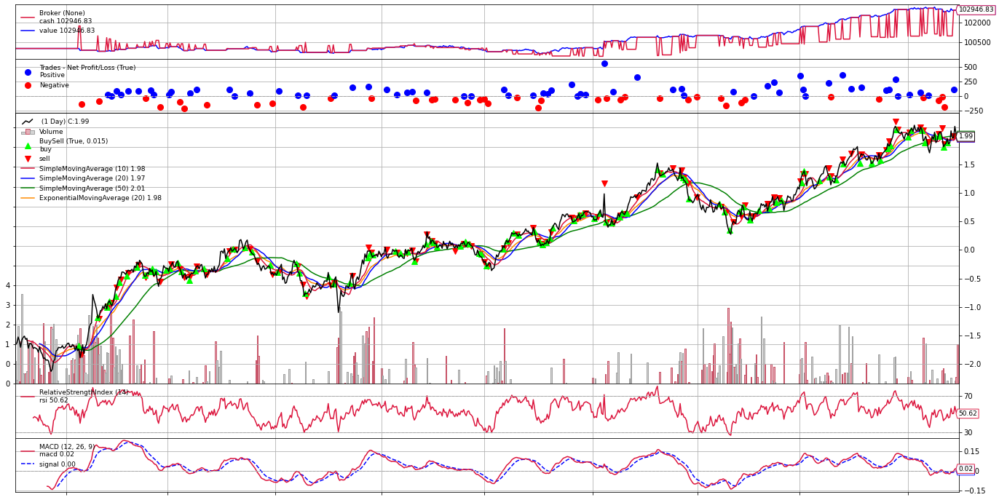

In [341]:
top_10['EXC'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

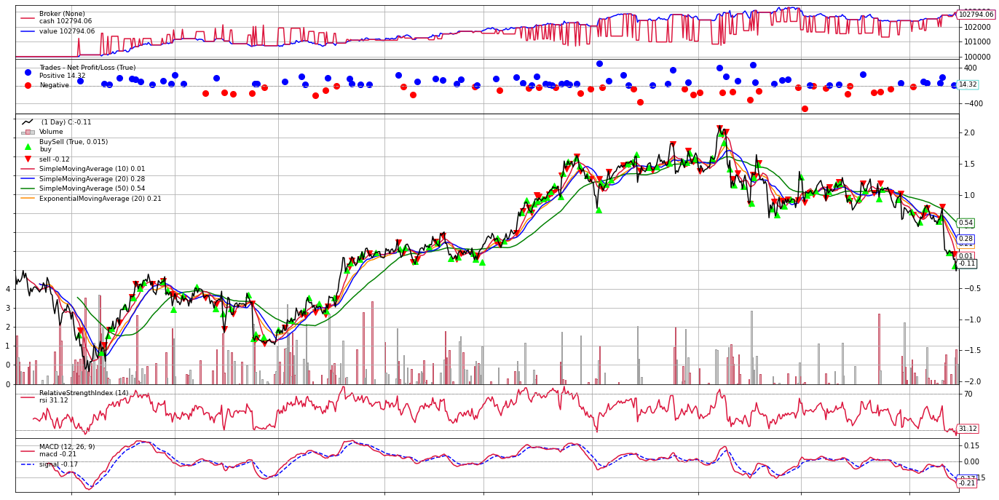

In [342]:
top_10['HIG'].plot()


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

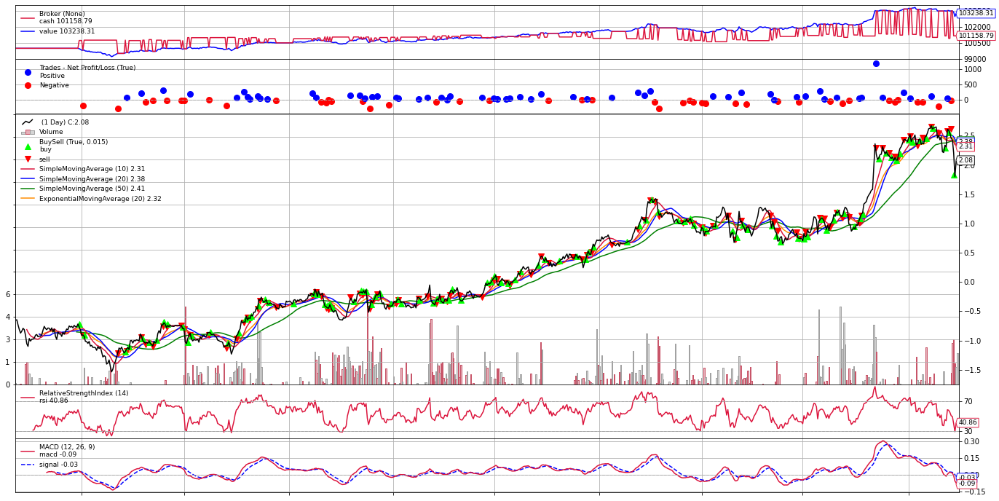

In [343]:
top_10['IQV'].plot()


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

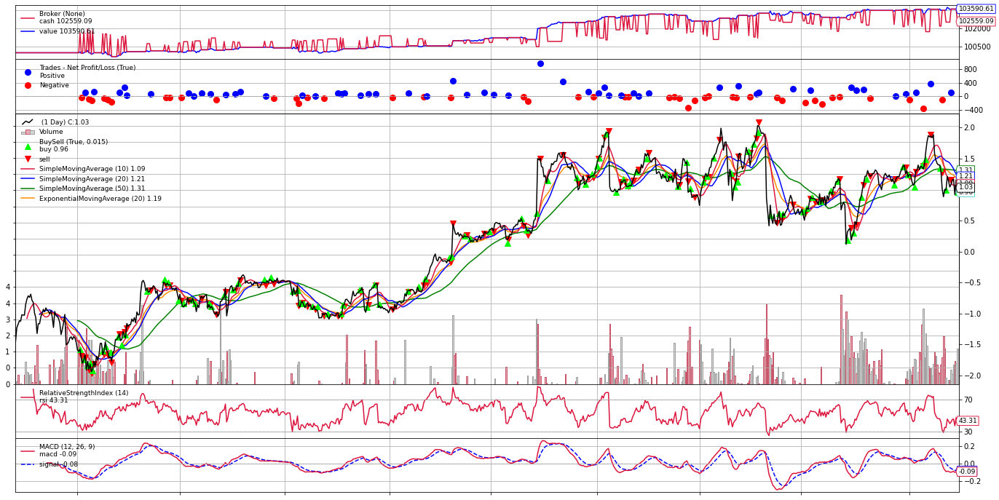

In [344]:
top_10['ORCL'].plot()


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

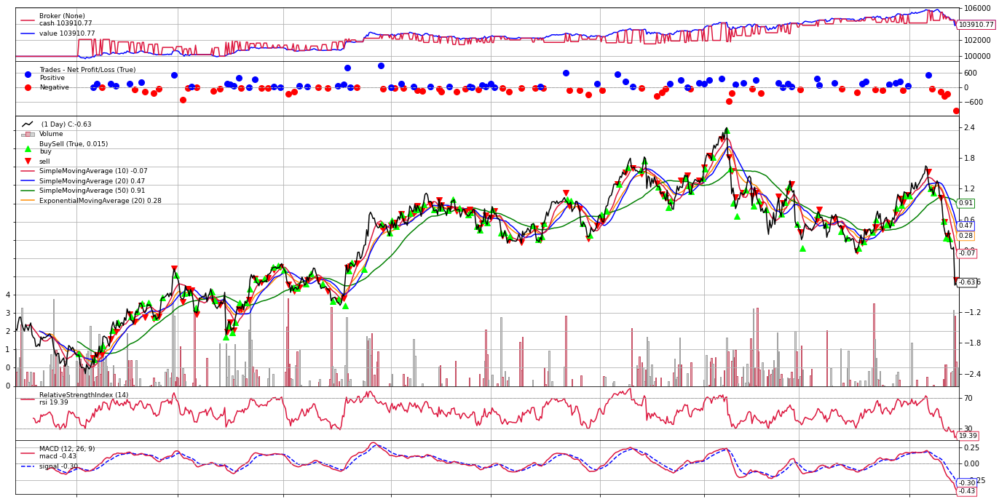

In [345]:
top_10['PCAR'].plot()


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

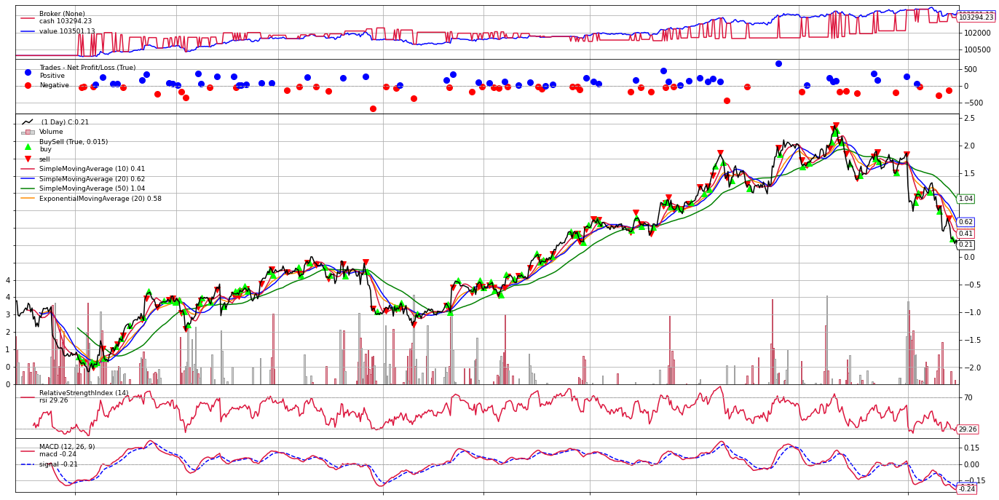

In [346]:
top_10['PVH'].plot()


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

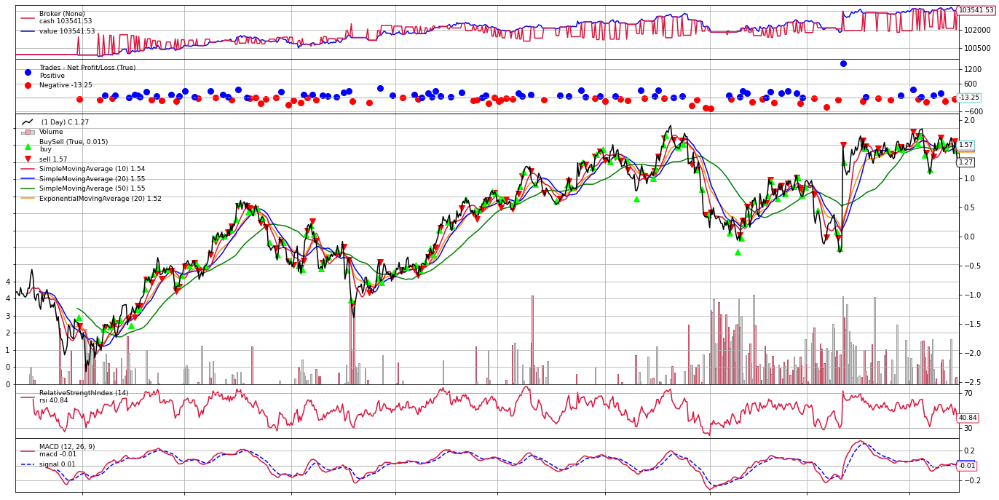

In [347]:
top_10['SRE'].plot()


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

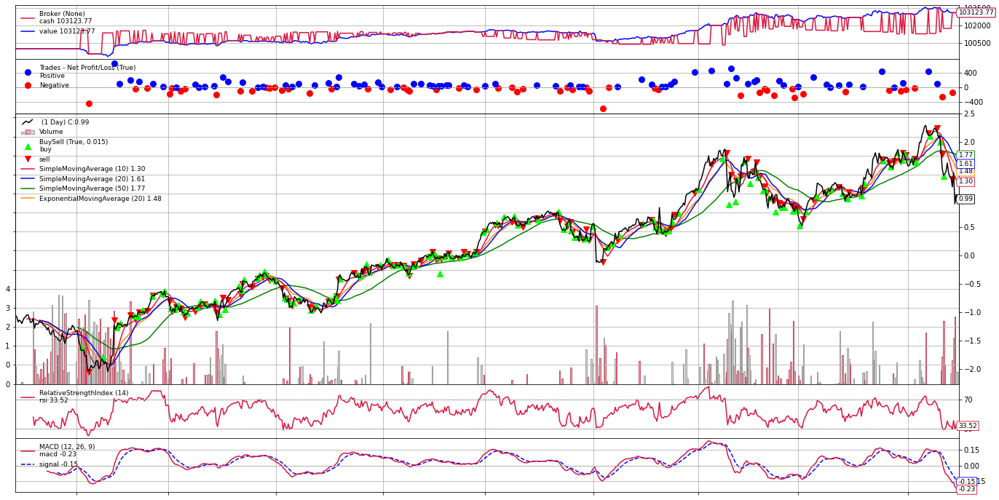

In [348]:
top_10['UTX'].plot()


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

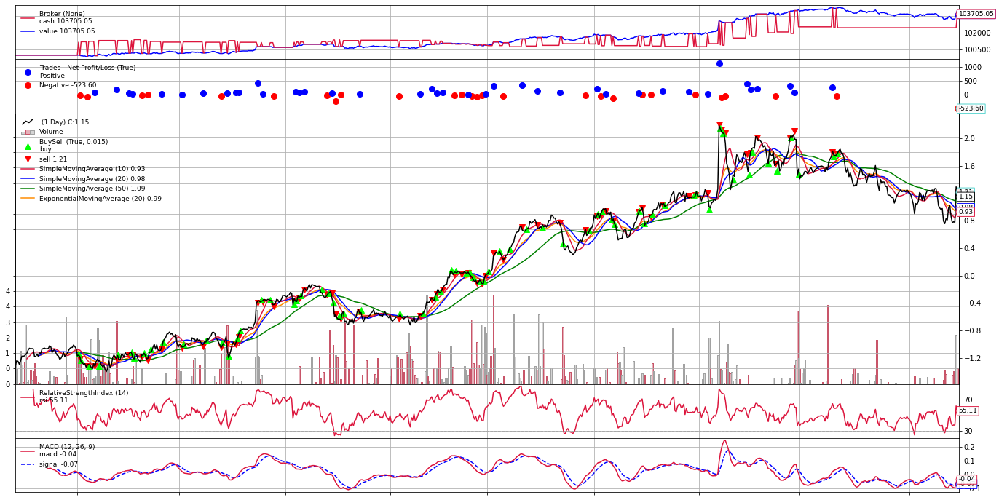

In [349]:
top_10['VAR'].plot()


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

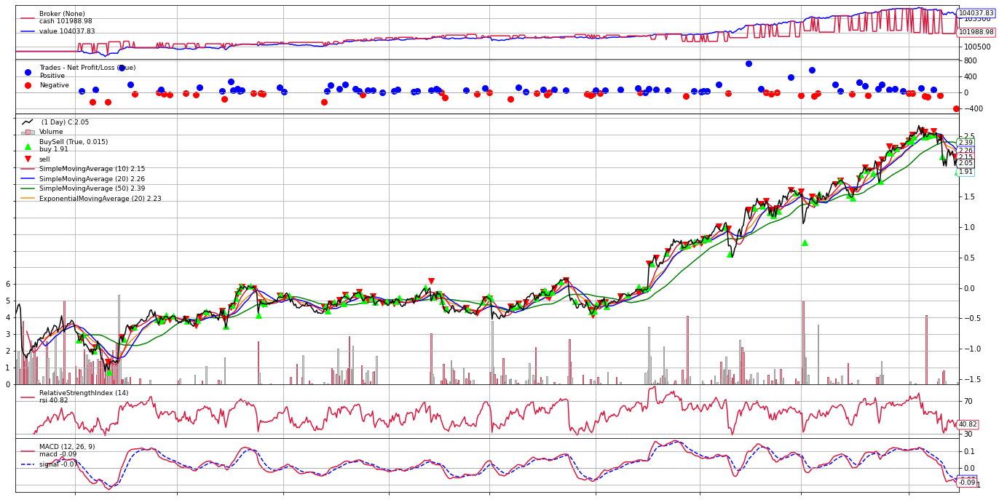

In [350]:
top_10['VRSK'].plot()

SVM - TOP 10

In [356]:

# from your_preprocessing_module import preprocess_data  # Assuming you have a function to preprocess data

data_dir = './stocks/'
stock_data = {}

for file_name in os.listdir(data_dir):
    if file_name.endswith('.csv'):
        ticker = file_name.split('.')[0]
        # df = pd.read_csv(os.path.join(data_dir, file_name))
        # print(os.path.join(data_dir, file_name))
        stock_data[ticker] = preprocess_data(os.path.join(data_dir, file_name), 'bfill', 'standard')

def add_features(df):
    df['daily_return'] = df['close'].pct_change() * 100
    for window in [10, 20, 50, 200]:
        df[f'moving_avg_{window}'] = df['close'].rolling(window=window).mean()
    df['ema_20'] = df['close'].ewm(span=20, adjust=False).mean()
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['rsi_14'] = 100 - (100 / (1 + rs))
    exp1 = df['close'].ewm(span=12, adjust=False).mean()
    exp2 = df['close'].ewm(span=26, adjust=False).mean()
    df['macd'] = exp1 - exp2
    df['signal_line'] = df['macd'].ewm(span=9, adjust=False).mean()
    df.dropna(inplace=True)
    return df

for ticker, df in stock_data.items():
    stock_data[ticker] = add_features(df)


In [357]:
top_return = ['SYF', 'HSY', 'ORCL' ,'ILMN', 'PX', 'PG', 'VFC', 'GM', 'PCAR', 'FFIV']

In [358]:

sharpe_ratios = {} 
draw_down_ratios = {}
return_best = {}
top_10 = {}

for ticker, df in stock_data.items():
    if ticker in top_return:
        print(ticker)
        def evaluate_model_performance(y_true, y_pred):
            accuracy = accuracy_score(y_true, y_pred)
            precision = precision_score(y_true, y_pred)
            return accuracy, precision

        def evaluate_performance(y_test, predictions, model_name):
            # Calculate accuracy and precision
            accuracy = accuracy_score(y_test, predictions)
            precision = precision_score(y_test, predictions)
            # Calculate the ROC curve and AUC
            fpr, tpr, _ = roc_curve(y_test, predictions)
            roc_auc = auc(fpr, tpr)
            # Display the ROC curve
            # RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name).plot()
            # Print the evaluation metrics
            print(f"{model_name} Accuracy: {accuracy:.4f}")
            print(f"{model_name} Precision: {precision:.4f}")
            print(f"{model_name} ROC AUC: {roc_auc:.4f}")

        df['date'] = pd.to_datetime(df['date'])
        # Set 'Date' as the index of the DataFrame
        df.set_index('date', inplace=True)
        # stock_data['EBAY']
        df.sort_index(inplace=True)
        # Create a binary classification target: 1 if the price will rise the next day, 0 otherwise
        df['target'] = (df['daily_return'] > 0).astype(int)
        # Select features and the target
        X = df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']]
        y = df['target']
        # Split the data into a training set and a testing set
        
        
        X_train, X_test, y_train, y_test

        min_samples_for_split = 42 
        if len(X) >= min_samples_for_split:
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
        else:
            # Handle the case where there's not enough data
            # You might choose to skip this dataset or adjust the test size
            print(f"Not enough data for ticker {ticker}. Only {len(X)} samples available.")
            continue  # Skip to the next iteration of the loop

        # Standardize the features
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        # Train an SVM model
        svm_model = svm.SVC()
        svm_model.fit(X_train_scaled, y_train)
        # Make predictions with the SVM model
        svm_predictions = svm_model.predict(X_test_scaled)
        # Evaluate the SVM model
        svm_accuracy = accuracy_score(y_test, svm_predictions)
        svm_class_report = classification_report(y_test, svm_predictions)
        # Assuming y_test and predictions are already defined
        svm_precision = precision_score(y_test, svm_predictions)
        # Evaluate SVM performance
        evaluate_performance(y_test, svm_predictions, 'SVM')
        # Here we prepare the features (X) and the target (y) for model training
        X = df[['moving_avg_10', 'moving_avg_20', 'moving_avg_50', 'ema_20', 'rsi_14', 'macd', 'signal_line']].values
        y = (df['daily_return'] > 0).astype(int).values  # Target: 1 if return > 0, else 0

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        # Train the SVM model
        svm_model = svm.SVC()
        svm_model.fit(X_train_scaled, y_train)
        # Save the scaler and model (do this in your local environment)
        joblib.dump(scaler, 'a_scaler.pkl')
        joblib.dump(svm_model, 'a_model.pkl')
        # Load the scaler and model (for demonstration; in practice, use the saved files)
        scaler = joblib.load('a_scaler.pkl')
        svm_model = joblib.load('a_model.pkl')
        # Define the Backtrader strategy using the trained SVM model
        class svm_a(bt.Strategy):
            params = (('model', svm_model), ('scaler', scaler),)
            
            def __init__(self):
                # Define indicators as part of the strategy
                self.sma10 = bt.indicators.SimpleMovingAverage(self.datas[0], period=10)
                self.sma20 = bt.indicators.SimpleMovingAverage(self.datas[0], period=20)
                self.sma50 = bt.indicators.SimpleMovingAverage(self.datas[0], period=50)
                self.ema20 = bt.indicators.ExponentialMovingAverage(self.datas[0], period=20)
                self.rsi = bt.indicators.RelativeStrengthIndex(self.datas[0], period=14)
                self.macd = bt.indicators.MACD(self.datas[0])
                self.signal_line = self.macd.signal

                # To keep track of pending orders
                self.order = None

            def next(self):
                # Skip the first lookback period
                if len(self) < 50:
                    return

                # Prepare the features for the current bar in the same way we did for training
                features = np.array([
                    (self.datas[0].close[0] - self.sma10[0]) / self.sma10[0],
                    (self.datas[0].close[0] - self.sma20[0]) / self.sma20[0],
                    (self.datas[0].close[0] - self.sma50[0]) / self.sma50[0],
                    (self.datas[0].close[0] - self.ema20[0]) / self.ema20[0],
                    self.rsi[0],
                    self.macd.macd[0],  # MACD line value
                    self.macd.signal[0],  # Signal line value
                ]).reshape(1, -1)  # Reshape for a single sample

                # Scale the features
                features_scaled = self.params.scaler.transform(features)

                # Make the prediction
                prediction = self.params.model.predict(features_scaled)

                # Execute orders based on the prediction
                if prediction > 0.5 and not self.position:
                    self.buy()
                elif prediction < 0.5 and self.position:
                    self.sell()



        # Instantiate Cerebro engine
        cerebro = bt.Cerebro()
        # Create a data feed from the pandas dataframe and add it to Cerebro
        data_feed = bt.feeds.PandasData(dataname=df)
        cerebro.adddata(data_feed)
        # Add the strategy to Cerebro
        cerebro.addstrategy(svm_a)
        # Set the initial cash
        initial_cash = 100000.0
        cerebro.broker.setcash(initial_cash)
        # Set the commission if any
        cerebro.broker.setcommission(commission=0.001)
        plt.rcParams['figure.figsize'] = [20, 10]
        cerebro.addsizer(bt.sizers.FixedSize, stake=1000)
        # Add analyzers for Sharpe Ratio and Drawdown
        cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe_ratio')
        cerebro.addanalyzer(bt.analyzers.DrawDown, _name='draw_down')
        # Run the strategy
        cerebro.run()
        # cerebro.plot()

        top_10[ticker] = cerebro

        results = cerebro.run()
        # Retrieve the analyzers
        sharpe_ratio_analyzer = results[0].analyzers.sharpe_ratio.get_analysis()
        drawdown_analyzer = results[0].analyzers.draw_down.get_analysis()
        final_value = cerebro.broker.getvalue()
        # Calculate the net return
        net_return = (final_value - initial_cash) / initial_cash * 100



        # Store the Sharpe Ratio in the dictionary
        sharpe_ratios[ticker] = sharpe_ratio_analyzer['sharperatio']
        draw_down_ratios[ticker] = drawdown_analyzer['max']['drawdown']
        return_best[ticker] = net_return
        

        # # Print the results
        print(f'Initial Portfolio Value: ${initial_cash:,.2f}')
        print(f'Final Portfolio Value: ${final_value:,.2f}')
        print(f'Net Return: {net_return:.2f}%')
        # Print the results
        print(f"Sharpe Ratio: {sharpe_ratio_analyzer['sharperatio']}")
        print(f"Max Drawdown: {drawdown_analyzer['max']['drawdown']}%")
        print(f"Max Drawdown Length: {drawdown_analyzer['max']['len']}")


FFIV
SVM Accuracy: 0.5900
SVM Precision: 0.5645
SVM ROC AUC: 0.5924
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $103,081.45
Net Return: 3.08%
Sharpe Ratio: -0.3353270161479543
Max Drawdown: 1.4103934067393997%
Max Drawdown Length: 242
GM
SVM Accuracy: 0.5671
SVM Precision: 0.5676
SVM ROC AUC: 0.5505
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $103,168.68
Net Return: 3.17%
Sharpe Ratio: -0.17743098680666766
Max Drawdown: 0.3238457024090171%
Max Drawdown Length: 117
HSY
SVM Accuracy: 0.5331
SVM Precision: 0.5238
SVM ROC AUC: 0.5329
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $104,078.00
Net Return: 4.08%
Sharpe Ratio: 0.009250157970300545
Max Drawdown: 2.303586083123246%
Max Drawdown Length: 309
ILMN
SVM Accuracy: 0.5436
SVM Precision: 0.5330
SVM ROC AUC: 0.5444
Initial Portfolio Value: $100,000.00
Final Portfolio Value: $103,741.84
Net Return: 3.74%
Sharpe Ratio: -0.1028269086941033
Max Drawdown: 0.9645492367533443%
Max Drawdown Length: 13

In [359]:
for ticker in top_10:
    print(ticker)

FFIV
GM
HSY
ILMN
ORCL
PCAR
PG
PX
SYF
VFC


<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

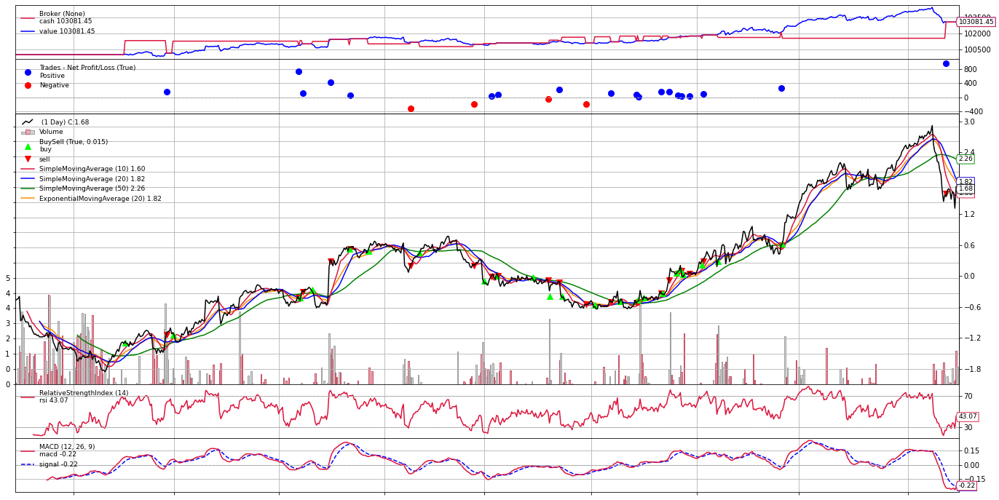

In [360]:
top_10['FFIV'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

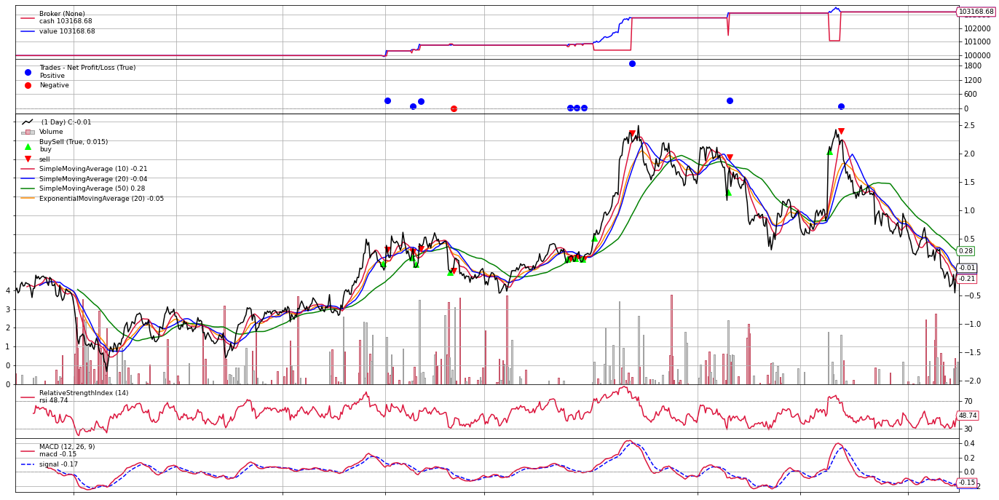

In [361]:
top_10['GM'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

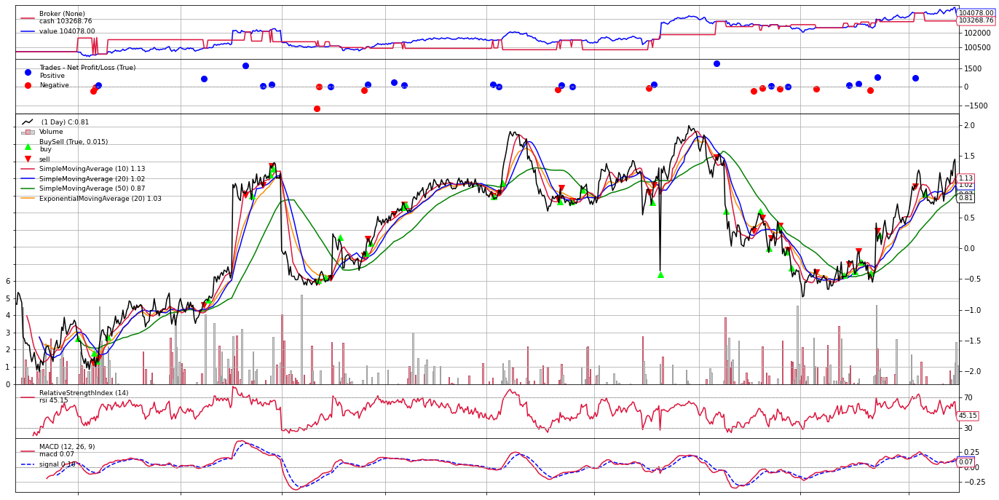

In [362]:
top_10['HSY'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

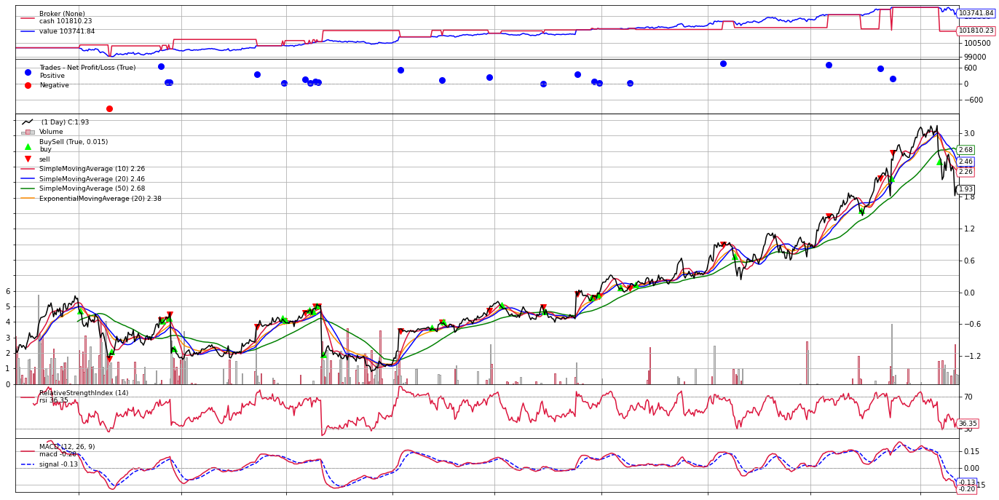

In [363]:
top_10['ILMN'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

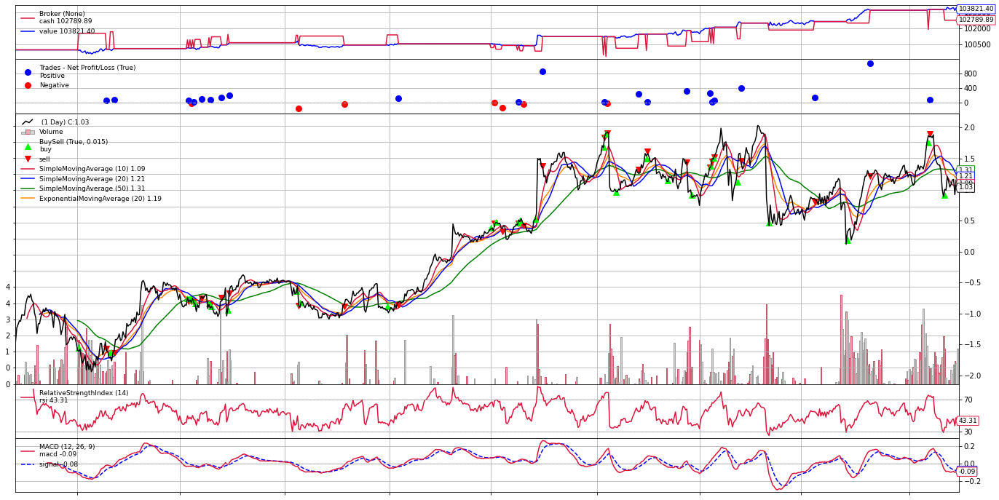

In [364]:
top_10['ORCL'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

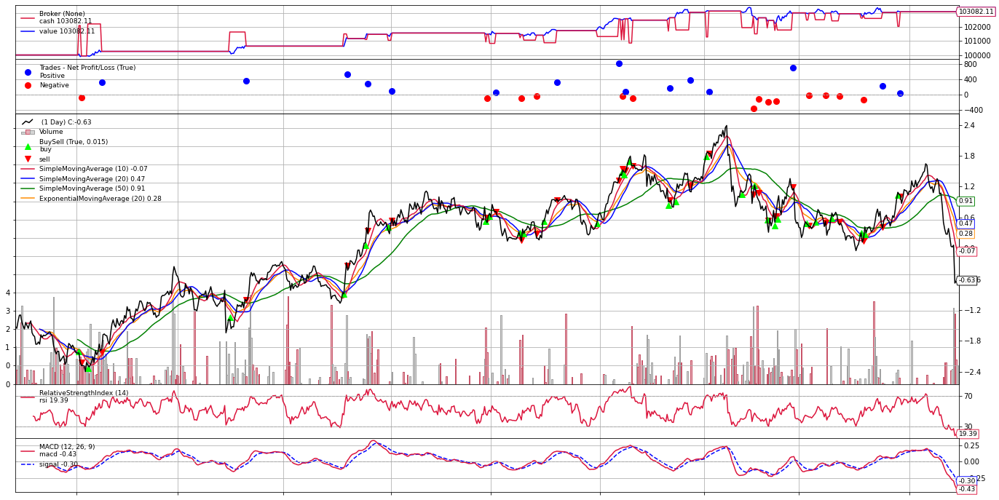

In [365]:
top_10['PCAR'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

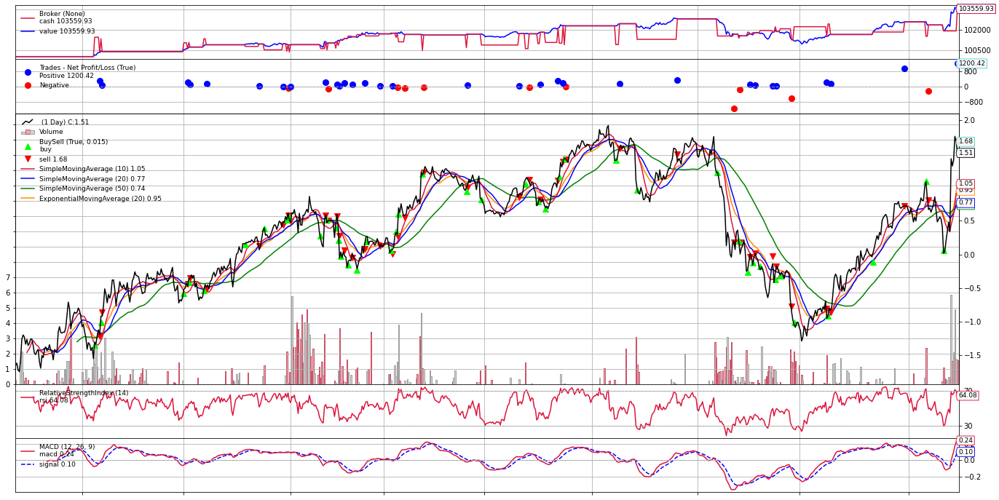

In [366]:
top_10['PG'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

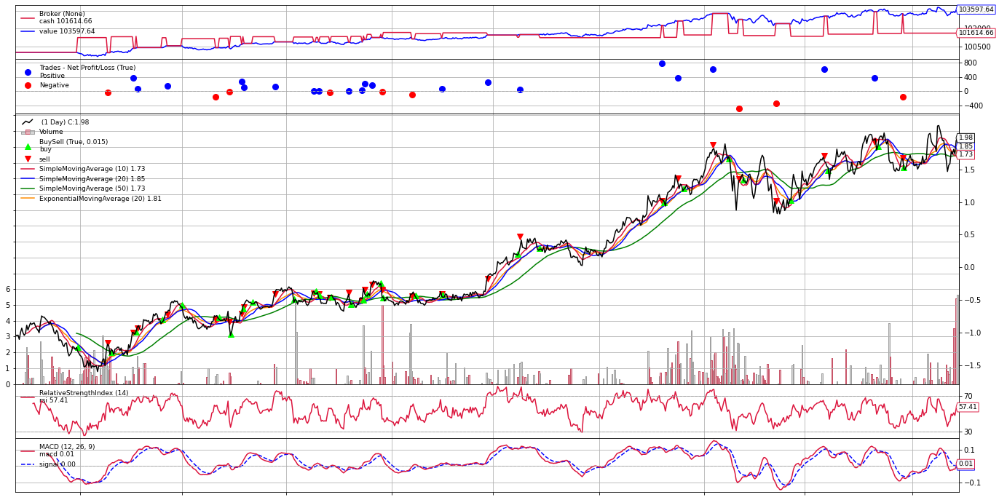

In [367]:
top_10['PX'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

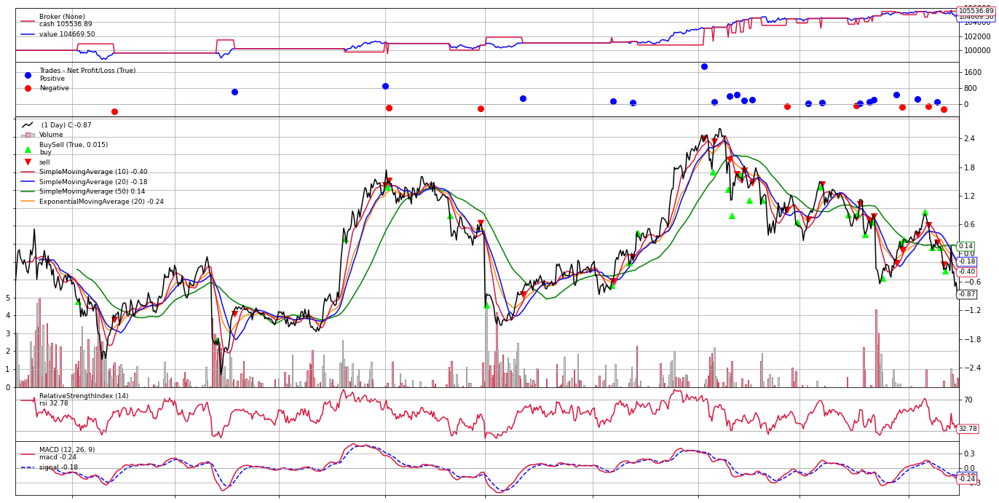

In [368]:
top_10['SYF'].plot()

<IPython.core.display.Javascript object>

[[<Figure size 1440x720 with 6 Axes>]]

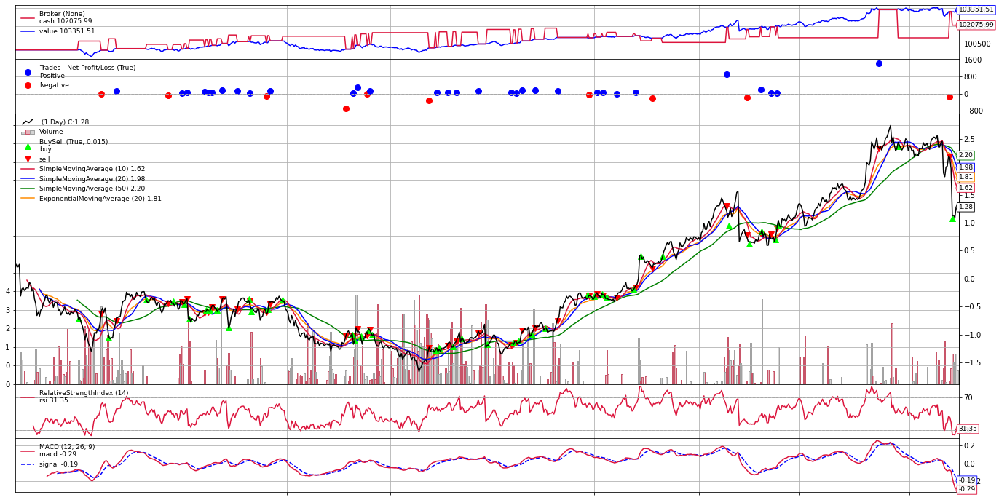

In [369]:
top_10['VFC'].plot()